1) load a data for a test
2) update a loop for test
3) for each epoch display a training loss , validation loss and test loss + ssim value also

# Data Loading

## Train

In [20]:
X_train_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismic_w_noise_vol_42487393.npy'
y_train_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismicCubes_RFC_fullstack_2024.42487393.npy'

## Test

In [21]:
X_test_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-test-data/2024-06-10_0d6402b1/seismic_w_noise_vol_44319345.npy'
y_test_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487919/seismicCubes_RFC_fullstack_2024.42487919.npy'

## Valid

In [22]:
X_valid_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42502775/seismic_w_noise_vol_42502775.npy'
y_valid_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42502775/seismicCubes_RFC_fullstack_2024.42502775.npy'

In [23]:
shape = (1259,300,300)
# load the data
# make the data in 2d section
# make the train set and test set
# print the image also

In [24]:
import os
import pandas as pd
import numpy as np
from torchvision.io import read_image
from torch.utils.data import Dataset,DataLoader
import torch
# 2 files
# 1259*300*300 ---> 1259*300 in 300 images
# x,y load
# x,y sub sample
# pair
# return
class volDataset(Dataset):
    def __init__(self, x_slices, y_slices, transform=None):
        """
        x_slices: List of noisy seismic slices (each of shape 1259x300)
        y_slices: List of clean seismic slices (each of shape 1259x300)
        """
        self.x_slices = x_slices
        self.y_slices = y_slices
        self.transform = transform

    def __len__(self):
        return len(self.x_slices)

    def __getitem__(self, idx):
        """Returns one slice (1, 1259, 300)"""
        x_slice = torch.tensor(self.x_slices[idx], dtype=torch.float32).unsqueeze(0)  # (1, 1259, 300)
        y_slice = torch.tensor(self.y_slices[idx], dtype=torch.float32).unsqueeze(0)  # (1, 1259, 300)

        if self.transform:
            x_slice = self.transform(x_slice)
            y_slice = self.transform(y_slice)

        return x_slice, y_slice

In [25]:
from sklearn.model_selection import train_test_split
# Convert volume to 2D slices
# Load seismic volumes
X_volume = np.load('/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismic_w_noise_vol_42487393.npy',allow_pickle=True)  # (1259, 300, 300)
y_volume = np.load('/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismicCubes_RFC_fullstack_2024.42487393.npy',allow_pickle=True)  # (1259, 300, 300)

X_volume_t = np.load(X_test_path,allow_pickle=True)
y_volume_t = np.load(y_test_path,allow_pickle=True)

X_volume_v = np.load(X_valid_path,allow_pickle=True)
y_volume_v = np.load(y_valid_path,allow_pickle=True)
# Convert volume to 2D slices

X_slices = [X_volume[:, :, i] for i in range(X_volume.shape[2])]  # List of 300 slices
y_slices = [y_volume[:, :, i] for i in range(y_volume.shape[2])]  # List of 300 slices

X_slices_t = [X_volume_t[:, :, i] for i in range(X_volume_t.shape[2])]
y_slices_t = [y_volume_t[:, :, i] for i in range(y_volume_t.shape[2])]

X_slices_v = [X_volume_v[:, :, i] for i in range(X_volume_v.shape[2])]
y_slices_v = [y_volume_v[:, :, i] for i in range(y_volume_v.shape[2])]

# Create datasets
train_dataset = volDataset(X_slices, y_slices)
valid_dataset = volDataset(X_slices_v,y_slices_v)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(valid_dataset,batch_size=8, shuffle=False)

# Check batch shapes
for x_batch, y_batch in train_loader:
    print("Train Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (8, 1, 1259, 300)
    break
for x_batch, y_batch in val_loader:
    print("valid Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (8, 1, 1259, 300)
    break

Train Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])
valid Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])


# Model

In [26]:
import os
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

In [27]:
class Crop2d(nn.Module):
    def __init__(self, left=10, right=10, top=21, bottom=0):
        super(Crop2d, self).__init__()
        self.left = left
        self.right = right
        self.top = top
        self.bottom = bottom

    def forward(self, x):
        return x[:, :, self.top:x.shape[2] - self.bottom, self.left:x.shape[3] - self.right]

In [28]:
class cnn_model(nn.Module):
    def __init__(self):
        super().__init__()


        self.cnn_model = nn.Sequential(
            nn.ZeroPad2d((10,10,21,0)),
            nn.Conv2d(in_channels=1, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),  # Corrected
            nn.ReLU(),
            nn.MaxPool2d(2, stride=2),

            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),  # Corrected
            nn.ReLU(),
            nn.MaxPool2d(2, stride=2),

            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),  # Corrected
            nn.ReLU(),
            nn.MaxPool2d(2, stride=2),

            nn.Conv2d(in_channels=64, out_channels=32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),  # Corrected
            nn.ReLU(),
            nn.MaxPool2d(2, stride=2),

            nn.Upsample(scale_factor=2),
            nn.ConvTranspose2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),  # Corrected
            nn.ReLU(),

            nn.Upsample(scale_factor=2),
            nn.ConvTranspose2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),  # Corrected
            nn.ReLU(),

            nn.Upsample(scale_factor=2),
            nn.ConvTranspose2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),  # Corrected
            nn.ReLU(),

            nn.Upsample(scale_factor=2),
            nn.ConvTranspose2d(in_channels=256, out_channels=1, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(1),
            nn.ReLU(),
            Crop2d(10, 10, 21, 0),
        )

    def forward(self,x):
        return self.cnn_model(x)
    
model = cnn_model()
x = torch.randn(1,1,1259,300)
output = model(x)

print(output.shape)
        

torch.Size([1, 1, 1259, 300])


In [29]:
pip install torcheval

Note: you may need to restart the kernel to use updated packages.


In [30]:
import torch
import torch.nn as nn
import torch.optim as optim

# Define model
model = cnn_model()

# Define Loss Function (MSE for denoising)
criterion = nn.MSELoss()

# Define Optimizer (Adam works well)
optimizer = optim.Adam(model.parameters(), lr=0.1)

In [31]:
# Check batch shapes
for x_batch, y_batch in train_loader:
    print("Train Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (batch_size, 1, 1259, 300)
    break

Train Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])


In [32]:
from torchmetrics import StructuralSimilarityIndexMeasure
ssim_metric = StructuralSimilarityIndexMeasure()

In [33]:
import matplotlib.pyplot as plt

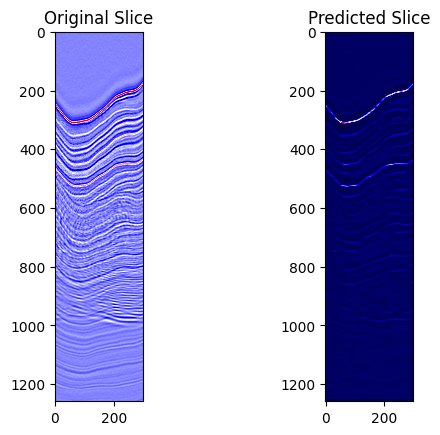

Epoch [1/200], Train Loss: 9401.4940, Train SSIM: 0.4812,           Val Loss: 8923.2064, Val SSIM: 0.3942


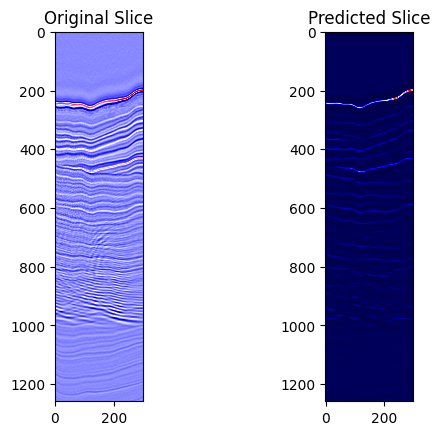

Epoch [2/200], Train Loss: 8669.1138, Train SSIM: 0.4889,           Val Loss: 8797.5599, Val SSIM: 0.4132


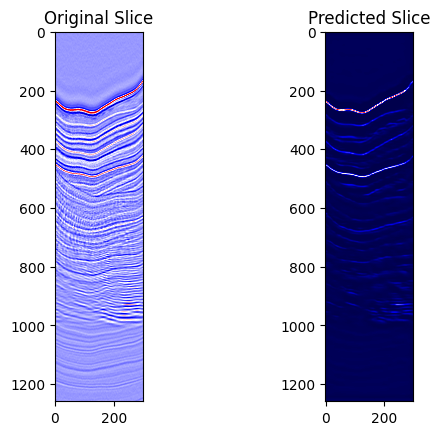

Epoch [3/200], Train Loss: 8019.0045, Train SSIM: 0.4953,           Val Loss: 8257.9265, Val SSIM: 0.4285


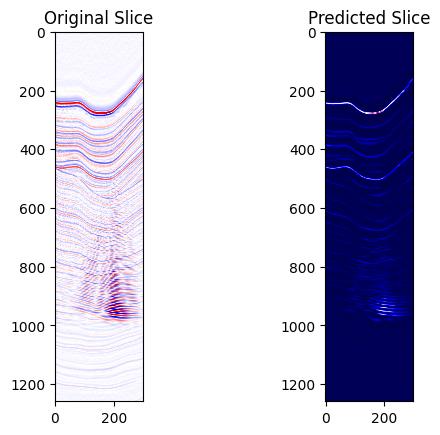

Epoch [4/200], Train Loss: 7486.0281, Train SSIM: 0.5040,           Val Loss: 7694.4424, Val SSIM: 0.4140


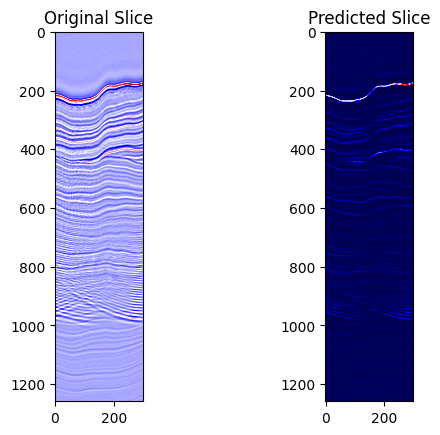

Epoch [5/200], Train Loss: 6963.8616, Train SSIM: 0.5119,           Val Loss: 7590.8774, Val SSIM: 0.3970


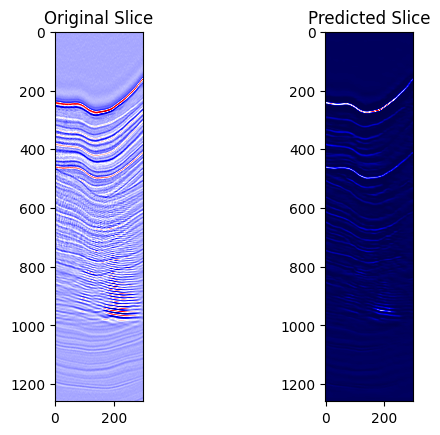

Epoch [6/200], Train Loss: 6536.5616, Train SSIM: 0.5242,           Val Loss: 7293.2827, Val SSIM: 0.3904


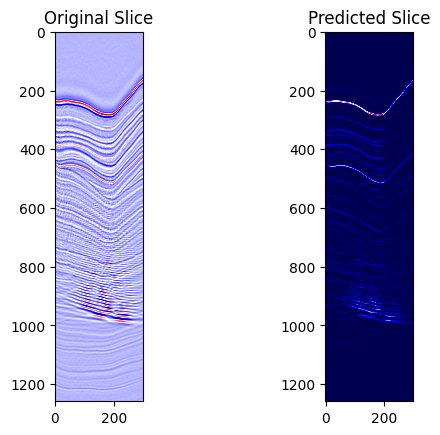

Epoch [7/200], Train Loss: 6176.0755, Train SSIM: 0.5336,           Val Loss: 7007.8817, Val SSIM: 0.4528


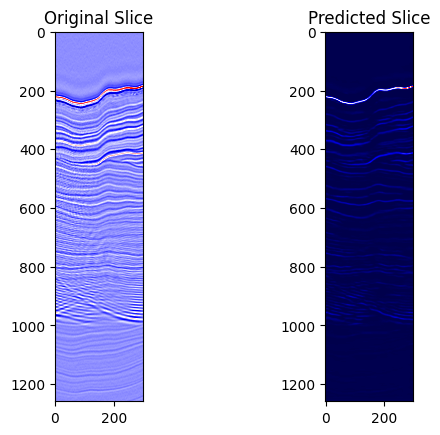

Epoch [8/200], Train Loss: 5870.2646, Train SSIM: 0.5444,           Val Loss: 6643.7874, Val SSIM: 0.4740


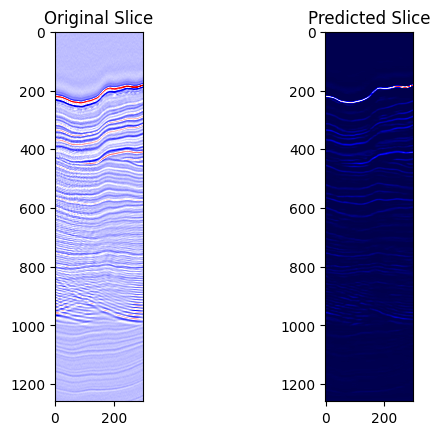

Epoch [9/200], Train Loss: 5608.9805, Train SSIM: 0.5510,           Val Loss: 6381.7856, Val SSIM: 0.4414


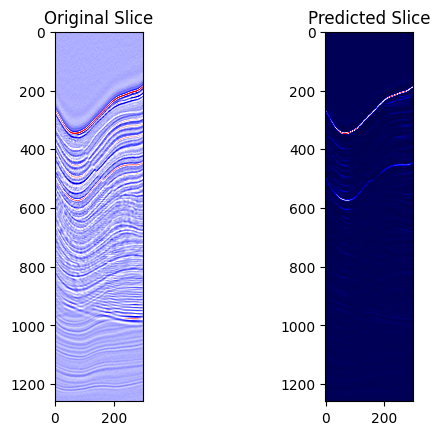

Epoch [10/200], Train Loss: 5357.7871, Train SSIM: 0.5628,           Val Loss: 6419.6482, Val SSIM: 0.3869


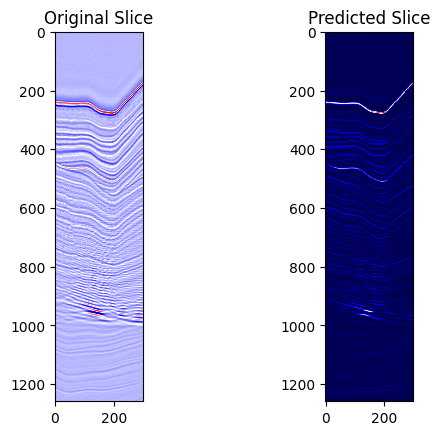

Epoch [11/200], Train Loss: 5199.3808, Train SSIM: 0.5678,           Val Loss: 6101.1311, Val SSIM: 0.3351


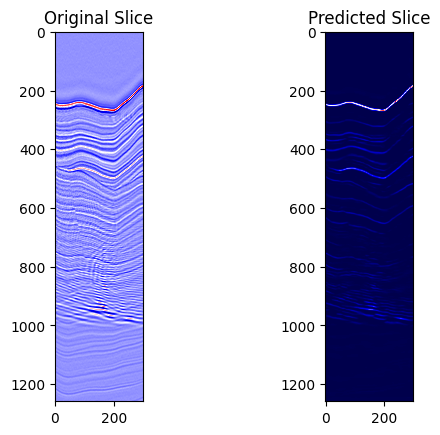

Epoch [12/200], Train Loss: 4998.4336, Train SSIM: 0.5750,           Val Loss: 6124.9149, Val SSIM: 0.4958


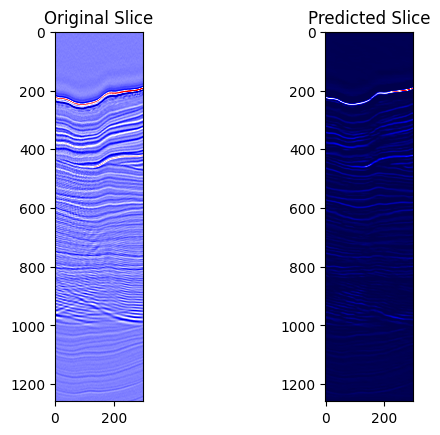

Epoch [13/200], Train Loss: 4847.6392, Train SSIM: 0.5841,           Val Loss: 5845.3927, Val SSIM: 0.3889


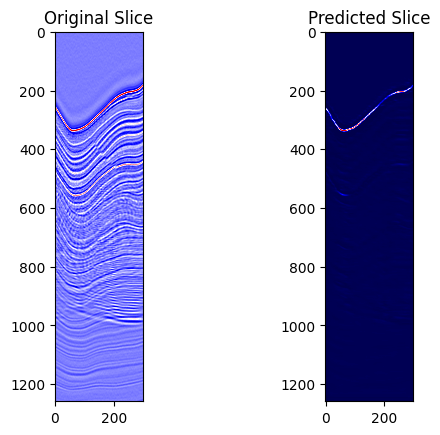

Epoch [14/200], Train Loss: 4725.1535, Train SSIM: 0.5891,           Val Loss: 7092.2287, Val SSIM: 0.3897


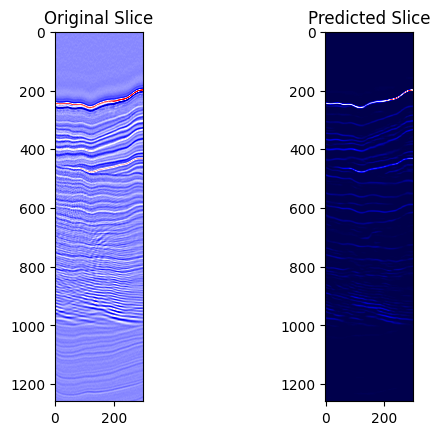

Epoch [15/200], Train Loss: 4610.7732, Train SSIM: 0.5941,           Val Loss: 5566.2356, Val SSIM: 0.5329


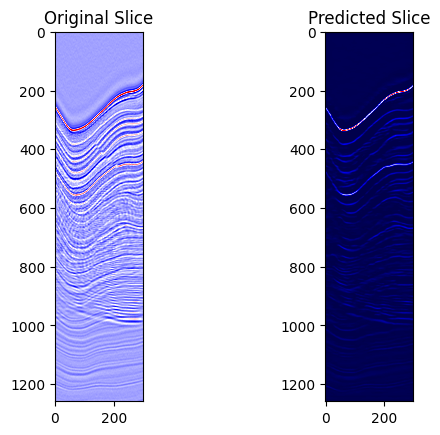

Epoch [16/200], Train Loss: 4545.1073, Train SSIM: 0.5982,           Val Loss: 5752.2531, Val SSIM: 0.4387


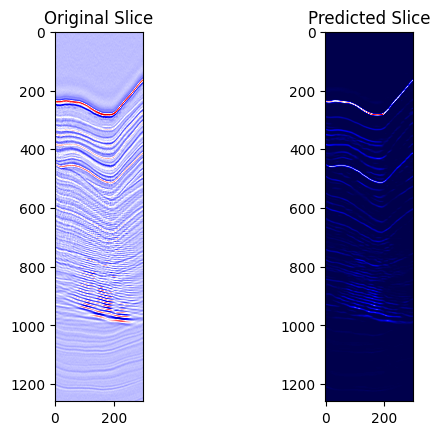

Epoch [17/200], Train Loss: 4461.0912, Train SSIM: 0.6017,           Val Loss: 5622.5434, Val SSIM: 0.5272


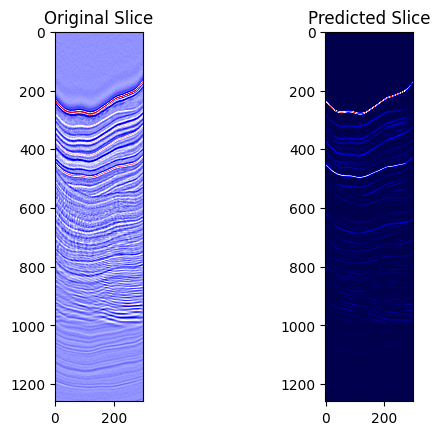

Epoch [18/200], Train Loss: 4382.8821, Train SSIM: 0.6052,           Val Loss: 5549.4154, Val SSIM: 0.5301


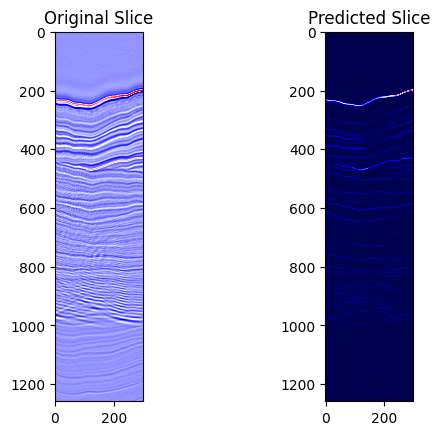

Epoch [19/200], Train Loss: 4343.7088, Train SSIM: 0.6062,           Val Loss: 5515.8379, Val SSIM: 0.5193


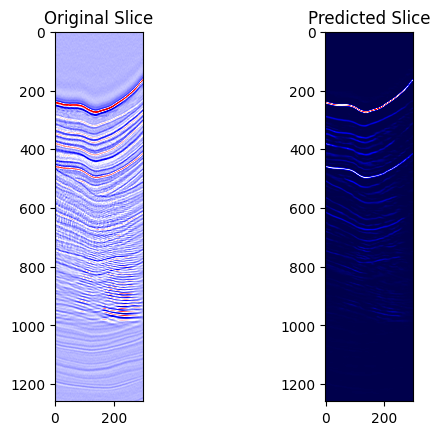

Epoch [20/200], Train Loss: 4280.8846, Train SSIM: 0.6113,           Val Loss: 5903.9399, Val SSIM: 0.4797


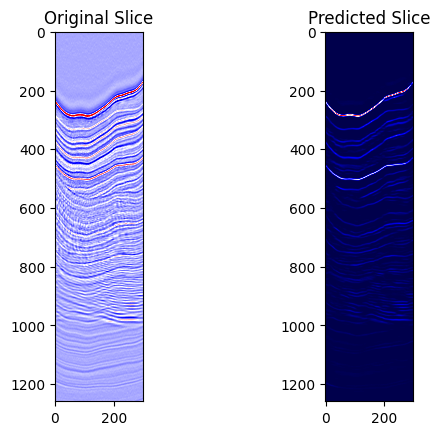

Epoch [21/200], Train Loss: 4248.5131, Train SSIM: 0.6138,           Val Loss: 5476.6104, Val SSIM: 0.5095


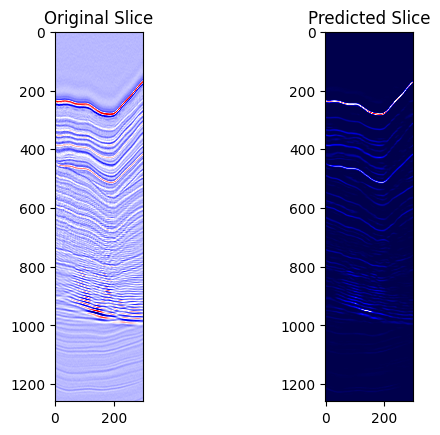

Epoch [22/200], Train Loss: 4222.5253, Train SSIM: 0.6148,           Val Loss: 5472.8739, Val SSIM: 0.5312


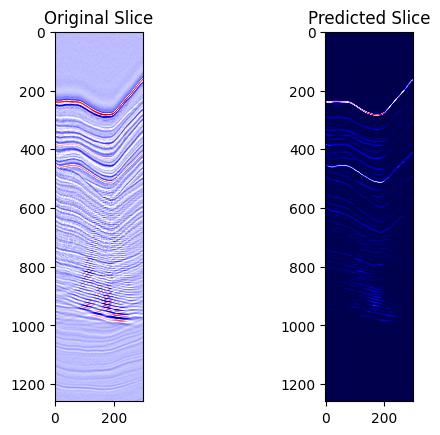

Epoch [23/200], Train Loss: 4190.0200, Train SSIM: 0.6170,           Val Loss: 5916.5935, Val SSIM: 0.4717


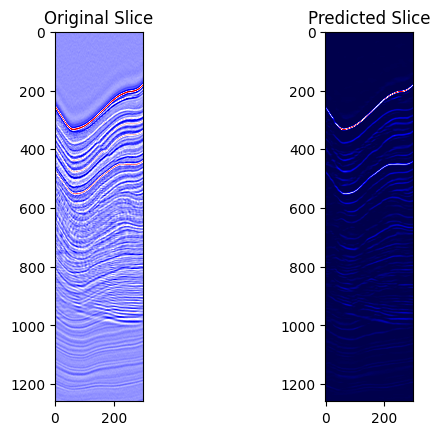

Epoch [24/200], Train Loss: 4163.4026, Train SSIM: 0.6184,           Val Loss: 5524.6548, Val SSIM: 0.4536


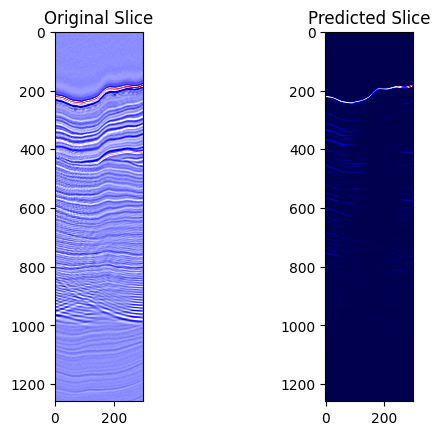

Epoch [25/200], Train Loss: 4160.6037, Train SSIM: 0.6162,           Val Loss: 6205.8021, Val SSIM: 0.4088


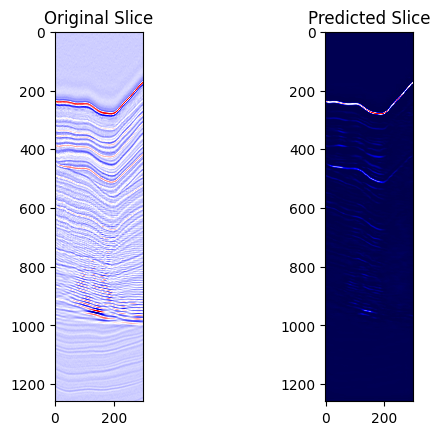

Epoch [26/200], Train Loss: 4139.8618, Train SSIM: 0.6181,           Val Loss: 6643.5389, Val SSIM: 0.3555


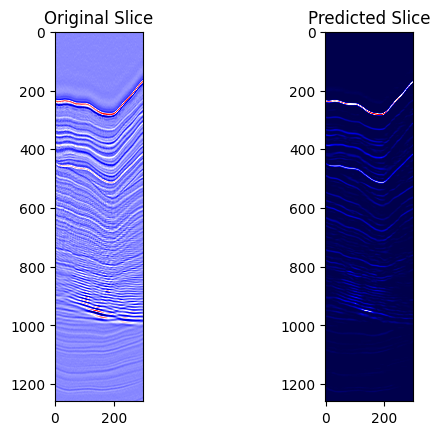

Epoch [27/200], Train Loss: 4138.9660, Train SSIM: 0.6188,           Val Loss: 5441.0165, Val SSIM: 0.5305


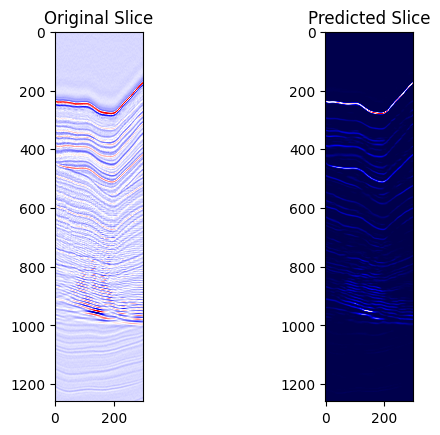

Epoch [28/200], Train Loss: 4119.1712, Train SSIM: 0.6193,           Val Loss: 5440.2232, Val SSIM: 0.5363


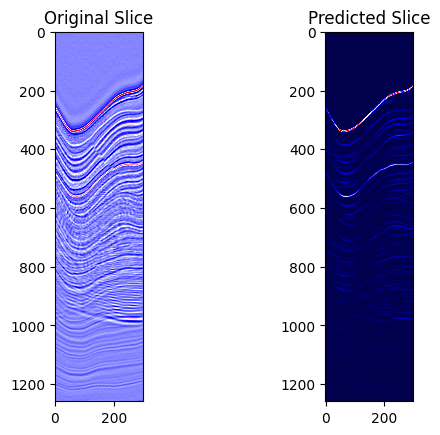

Epoch [29/200], Train Loss: 4094.1844, Train SSIM: 0.6224,           Val Loss: 5421.2363, Val SSIM: 0.5417


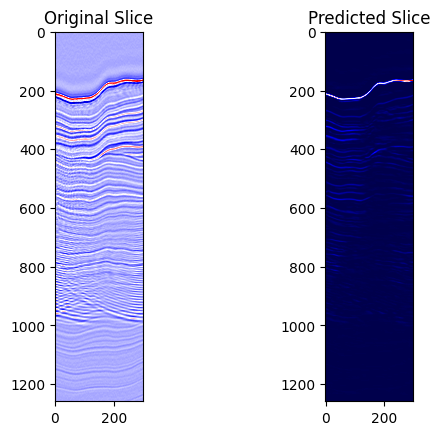

Epoch [30/200], Train Loss: 4096.9512, Train SSIM: 0.6217,           Val Loss: 5820.4671, Val SSIM: 0.4862


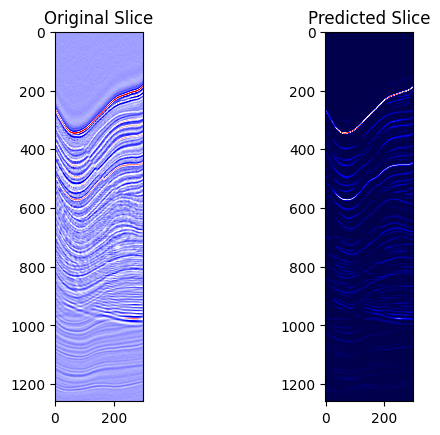

Epoch [31/200], Train Loss: 4101.4338, Train SSIM: 0.6220,           Val Loss: 5732.9116, Val SSIM: 0.4388


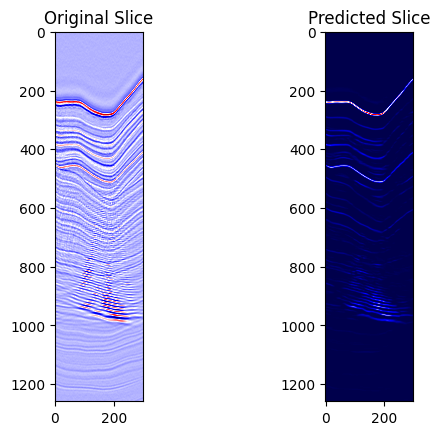

Epoch [32/200], Train Loss: 4107.1140, Train SSIM: 0.6210,           Val Loss: 5459.7980, Val SSIM: 0.5292


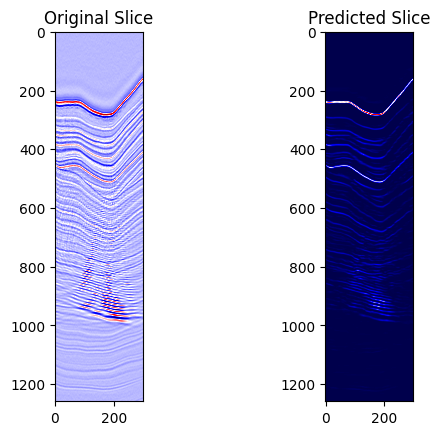

Epoch [33/200], Train Loss: 4091.0430, Train SSIM: 0.6223,           Val Loss: 5628.0475, Val SSIM: 0.5097


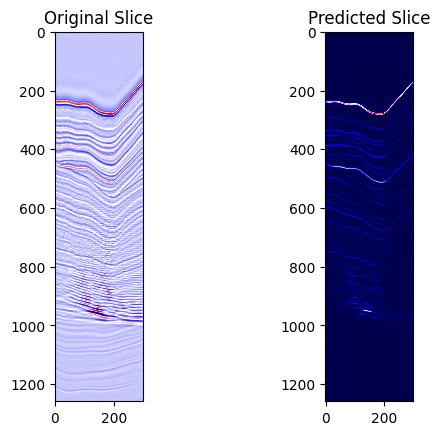

Epoch [34/200], Train Loss: 4071.6382, Train SSIM: 0.6235,           Val Loss: 5897.9114, Val SSIM: 0.4790


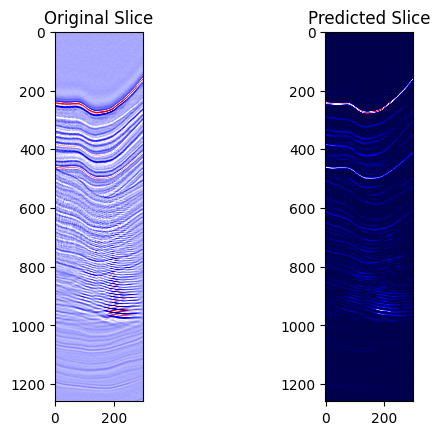

Epoch [35/200], Train Loss: 4074.0536, Train SSIM: 0.6243,           Val Loss: 5412.0114, Val SSIM: 0.5238


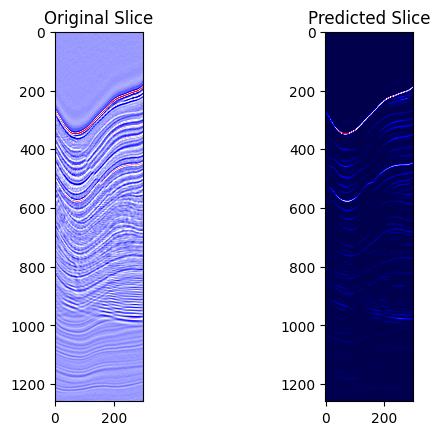

Epoch [36/200], Train Loss: 4057.6427, Train SSIM: 0.6241,           Val Loss: 5385.2088, Val SSIM: 0.5077


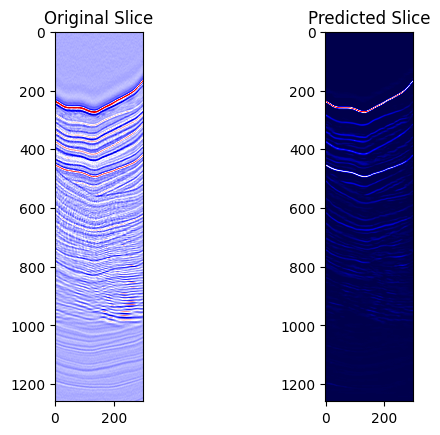

Epoch [37/200], Train Loss: 4066.3839, Train SSIM: 0.6247,           Val Loss: 5753.4913, Val SSIM: 0.4953


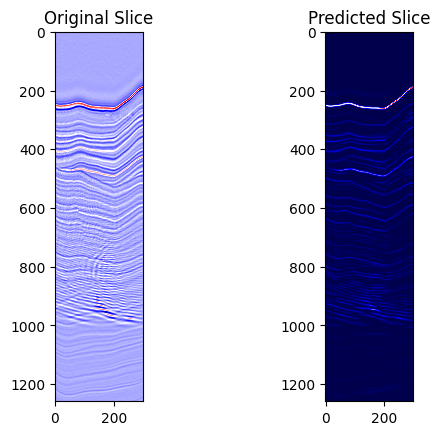

Epoch [38/200], Train Loss: 4075.6636, Train SSIM: 0.6242,           Val Loss: 5635.9119, Val SSIM: 0.4275


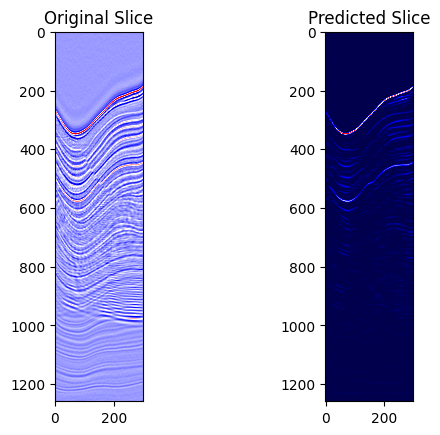

Epoch [39/200], Train Loss: 4075.0442, Train SSIM: 0.6246,           Val Loss: 5928.0846, Val SSIM: 0.4739


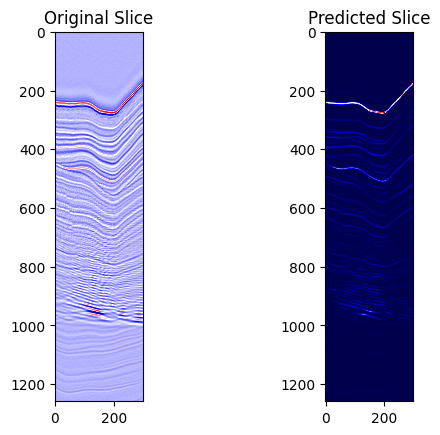

Epoch [40/200], Train Loss: 4049.8097, Train SSIM: 0.6265,           Val Loss: 5525.2010, Val SSIM: 0.5245


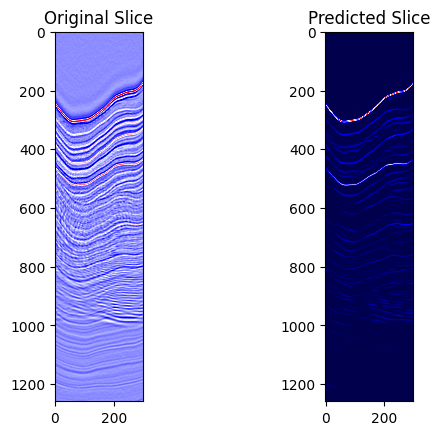

Epoch [41/200], Train Loss: 4035.3322, Train SSIM: 0.6262,           Val Loss: 5412.0207, Val SSIM: 0.5385


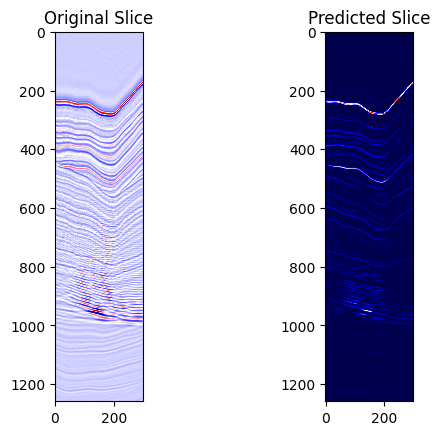

Epoch [42/200], Train Loss: 4051.3632, Train SSIM: 0.6269,           Val Loss: 5401.6798, Val SSIM: 0.5417


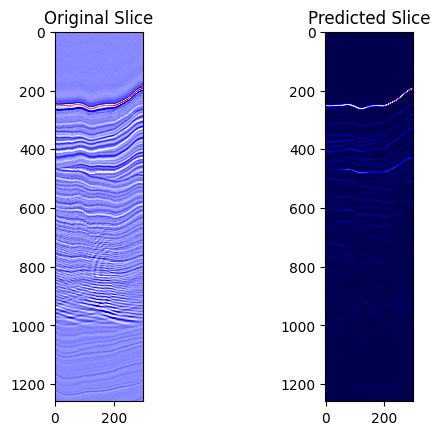

Epoch [43/200], Train Loss: 4044.5594, Train SSIM: 0.6270,           Val Loss: 6080.5364, Val SSIM: 0.4576


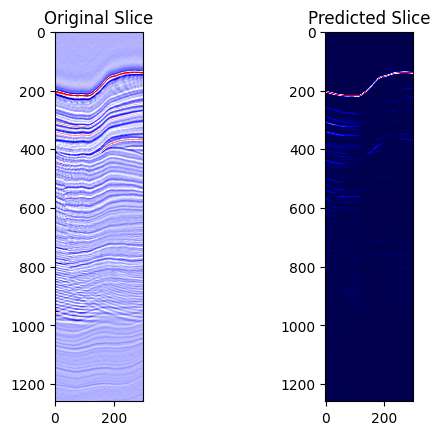

Epoch [44/200], Train Loss: 4039.8624, Train SSIM: 0.6269,           Val Loss: 6158.9187, Val SSIM: 0.4582


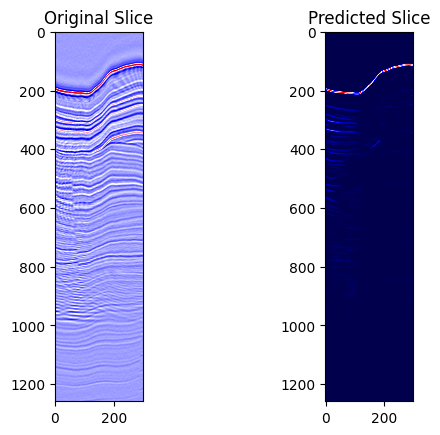

Epoch [45/200], Train Loss: 4037.8115, Train SSIM: 0.6268,           Val Loss: 6336.4413, Val SSIM: 0.4493


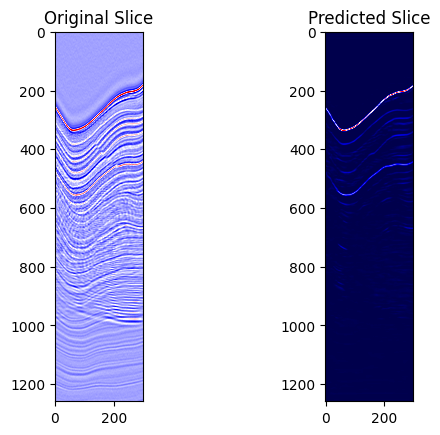

Epoch [46/200], Train Loss: 4043.4507, Train SSIM: 0.6271,           Val Loss: 5992.7377, Val SSIM: 0.4650


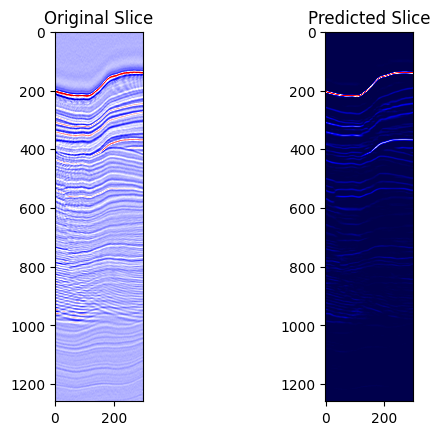

Epoch [47/200], Train Loss: 4037.5515, Train SSIM: 0.6271,           Val Loss: 5400.5620, Val SSIM: 0.5397


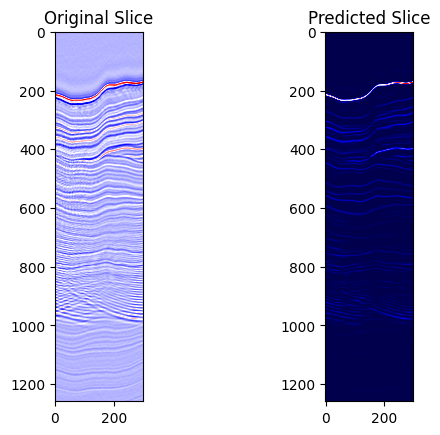

Epoch [48/200], Train Loss: 4036.6913, Train SSIM: 0.6274,           Val Loss: 5465.6668, Val SSIM: 0.5452


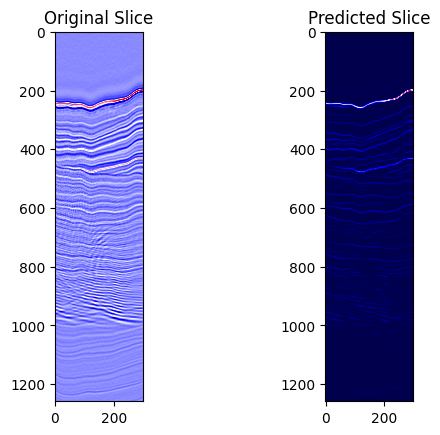

Epoch [49/200], Train Loss: 4022.3545, Train SSIM: 0.6283,           Val Loss: 5395.3696, Val SSIM: 0.5409


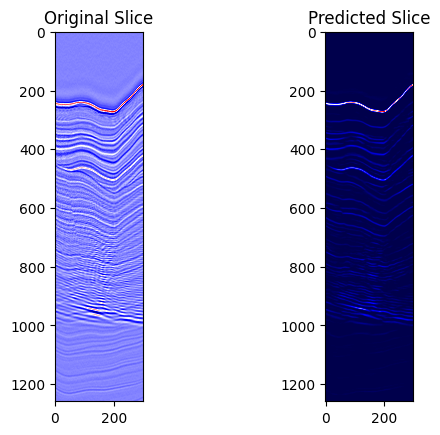

Epoch [50/200], Train Loss: 4025.9074, Train SSIM: 0.6281,           Val Loss: 5456.3794, Val SSIM: 0.5263


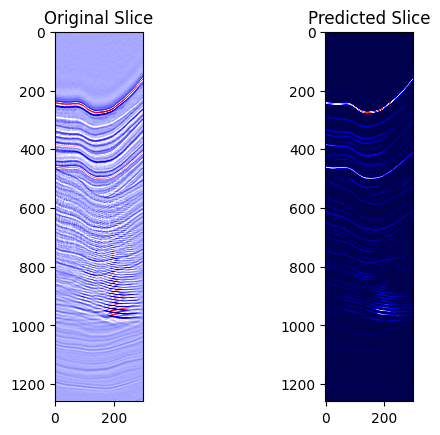

Epoch [51/200], Train Loss: 4019.3327, Train SSIM: 0.6289,           Val Loss: 5427.7462, Val SSIM: 0.5151


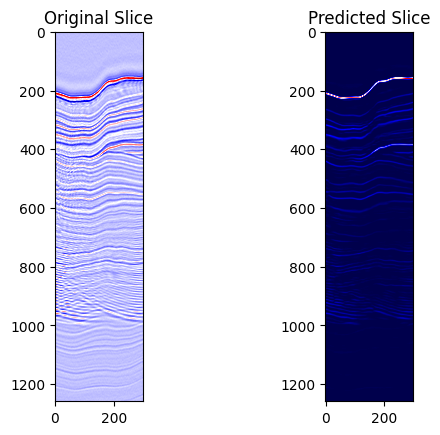

Epoch [52/200], Train Loss: 4023.9964, Train SSIM: 0.6293,           Val Loss: 5433.2494, Val SSIM: 0.5430


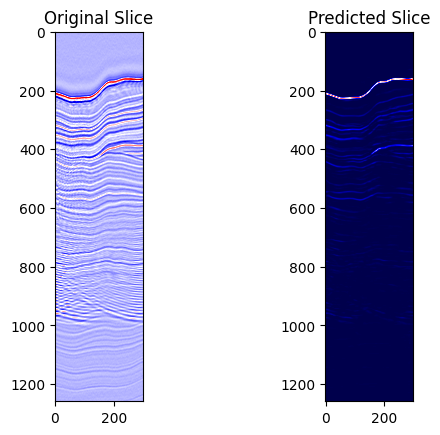

Epoch [53/200], Train Loss: 4026.6920, Train SSIM: 0.6286,           Val Loss: 5800.2476, Val SSIM: 0.4850


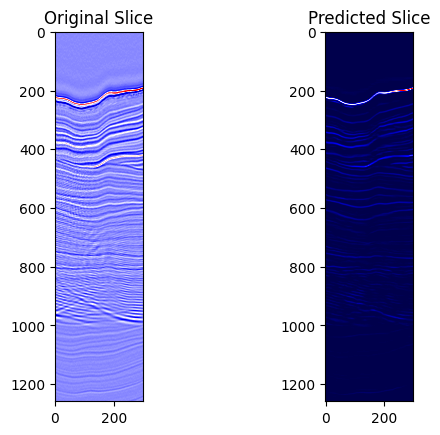

Epoch [54/200], Train Loss: 4027.7014, Train SSIM: 0.6298,           Val Loss: 5403.5395, Val SSIM: 0.5467


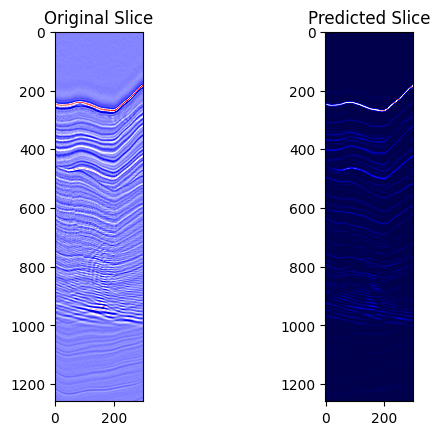

Epoch [55/200], Train Loss: 4016.4305, Train SSIM: 0.6294,           Val Loss: 5416.5132, Val SSIM: 0.5289


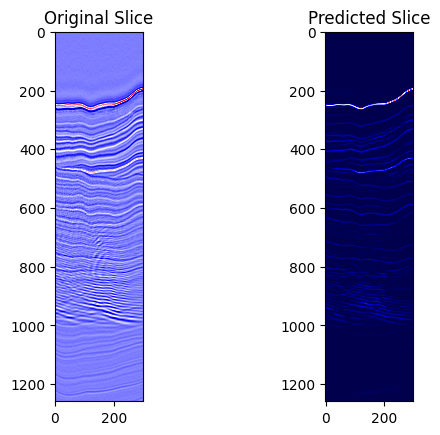

Epoch [56/200], Train Loss: 4020.3172, Train SSIM: 0.6292,           Val Loss: 5442.9736, Val SSIM: 0.5376


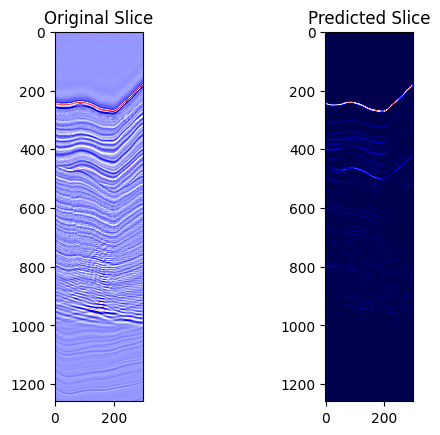

Epoch [57/200], Train Loss: 4025.0730, Train SSIM: 0.6285,           Val Loss: 6481.1579, Val SSIM: 0.4402


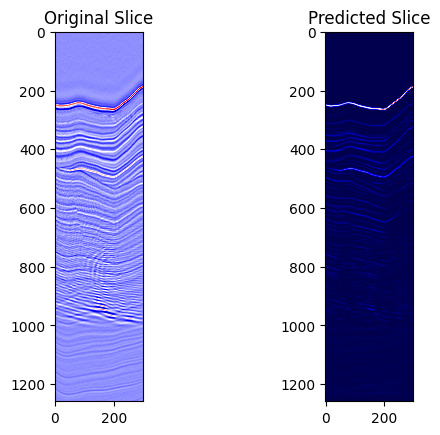

Epoch [58/200], Train Loss: 4015.2970, Train SSIM: 0.6293,           Val Loss: 5963.2758, Val SSIM: 0.4475


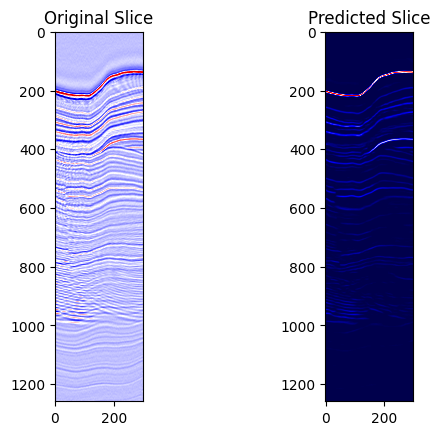

Epoch [59/200], Train Loss: 4016.0424, Train SSIM: 0.6297,           Val Loss: 5477.8343, Val SSIM: 0.5454


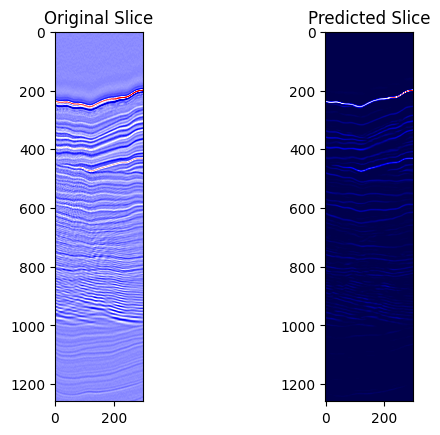

Epoch [60/200], Train Loss: 4010.1973, Train SSIM: 0.6302,           Val Loss: 5427.4270, Val SSIM: 0.5486


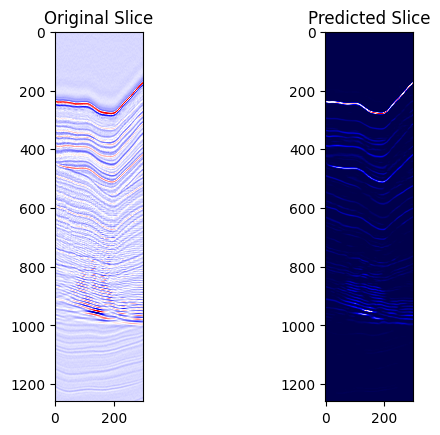

Epoch [61/200], Train Loss: 4011.1800, Train SSIM: 0.6291,           Val Loss: 5450.7143, Val SSIM: 0.5455


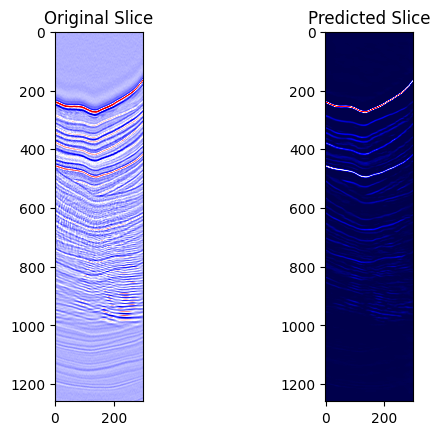

Epoch [62/200], Train Loss: 4006.1865, Train SSIM: 0.6307,           Val Loss: 5546.2608, Val SSIM: 0.5104


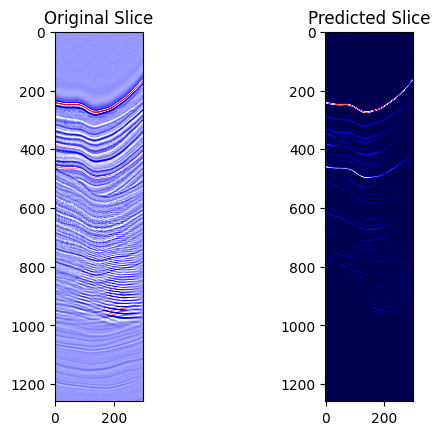

Epoch [63/200], Train Loss: 3998.2409, Train SSIM: 0.6314,           Val Loss: 6236.1102, Val SSIM: 0.4579


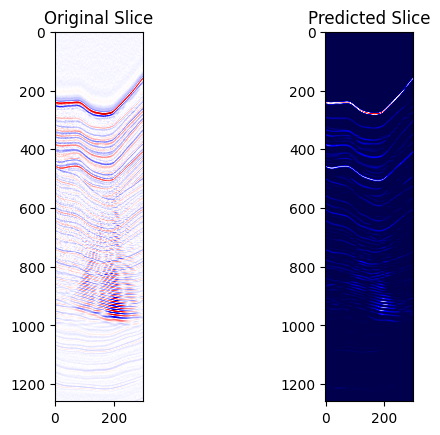

Epoch [64/200], Train Loss: 4010.7913, Train SSIM: 0.6305,           Val Loss: 5596.2257, Val SSIM: 0.5150


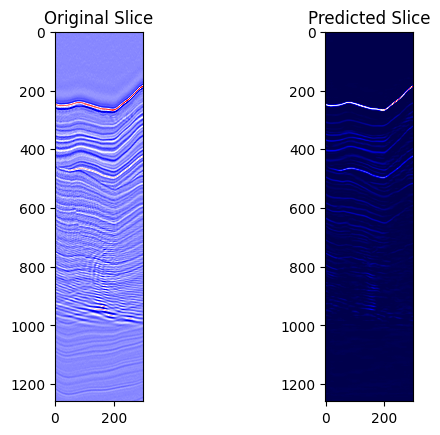

Epoch [65/200], Train Loss: 4010.6306, Train SSIM: 0.6316,           Val Loss: 5918.8348, Val SSIM: 0.4732


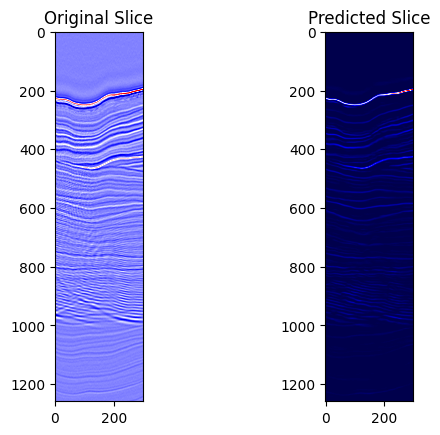

Epoch [66/200], Train Loss: 4003.4781, Train SSIM: 0.6301,           Val Loss: 5571.3812, Val SSIM: 0.5123


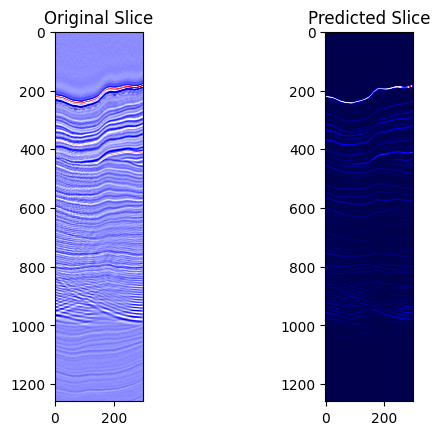

Epoch [67/200], Train Loss: 4011.5059, Train SSIM: 0.6303,           Val Loss: 5565.1033, Val SSIM: 0.5330


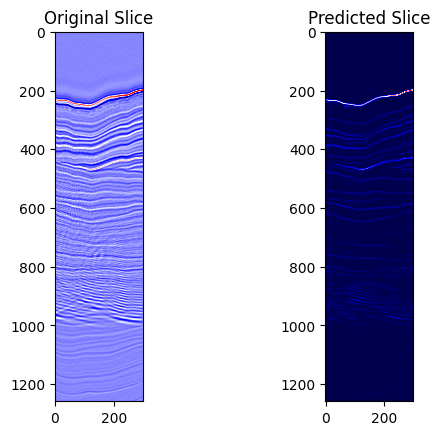

Epoch [68/200], Train Loss: 3999.2750, Train SSIM: 0.6304,           Val Loss: 5488.6862, Val SSIM: 0.5372


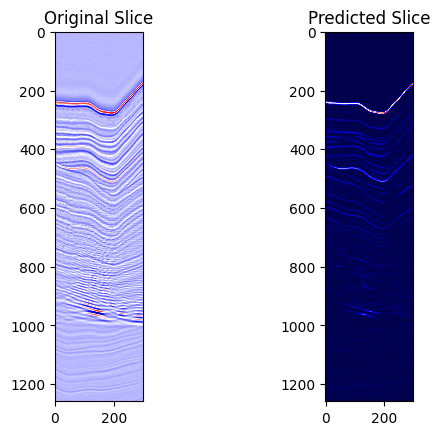

Epoch [69/200], Train Loss: 4002.1941, Train SSIM: 0.6317,           Val Loss: 6017.2985, Val SSIM: 0.4612


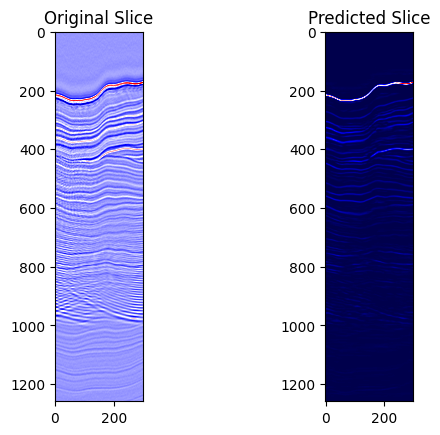

Epoch [70/200], Train Loss: 4005.4693, Train SSIM: 0.6311,           Val Loss: 5591.0206, Val SSIM: 0.5020


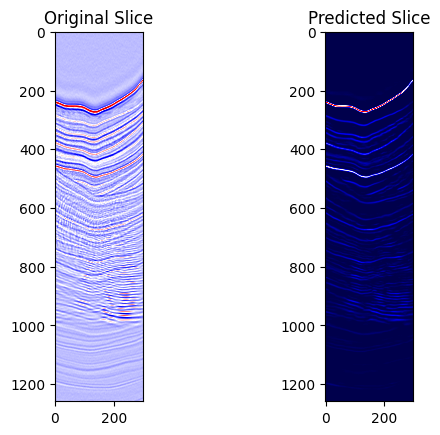

Epoch [71/200], Train Loss: 3998.8945, Train SSIM: 0.6320,           Val Loss: 5550.4962, Val SSIM: 0.4942


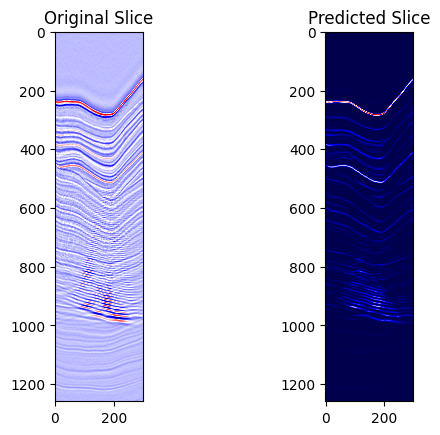

Epoch [72/200], Train Loss: 3992.5663, Train SSIM: 0.6324,           Val Loss: 5513.5137, Val SSIM: 0.5422


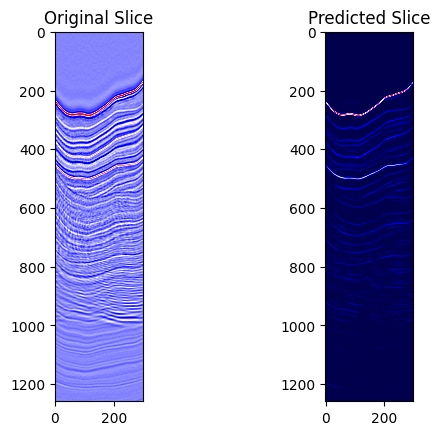

Epoch [73/200], Train Loss: 3990.8571, Train SSIM: 0.6320,           Val Loss: 5539.1658, Val SSIM: 0.5249


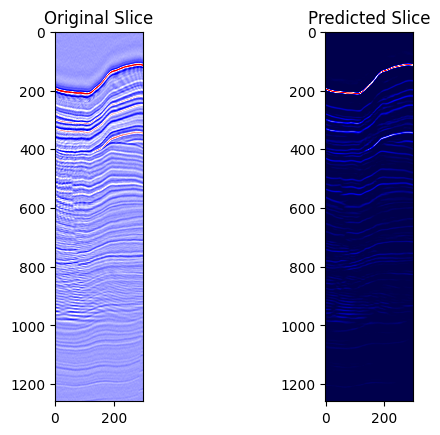

Epoch [74/200], Train Loss: 3997.8622, Train SSIM: 0.6329,           Val Loss: 5530.2846, Val SSIM: 0.5369


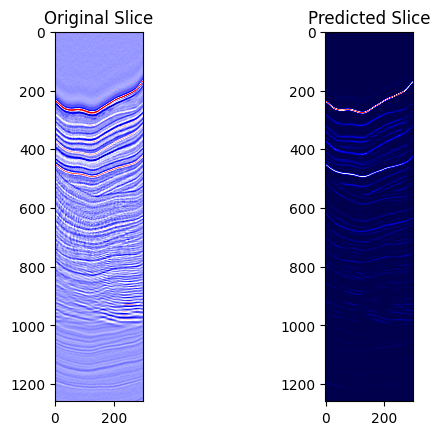

Epoch [75/200], Train Loss: 4009.3556, Train SSIM: 0.6320,           Val Loss: 5487.0250, Val SSIM: 0.5300


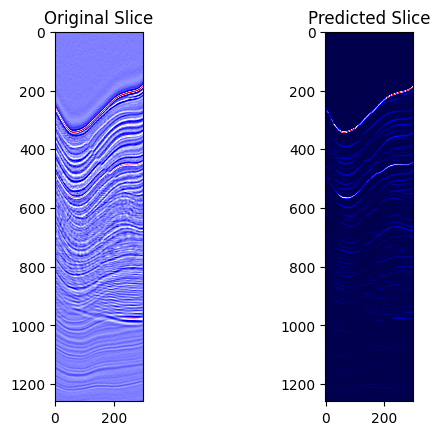

Epoch [76/200], Train Loss: 3987.4094, Train SSIM: 0.6329,           Val Loss: 5484.3104, Val SSIM: 0.5361


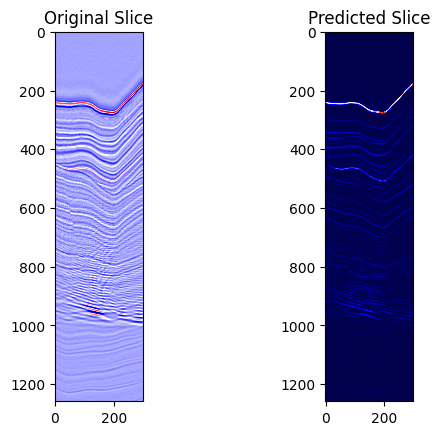

Epoch [77/200], Train Loss: 3994.2358, Train SSIM: 0.6317,           Val Loss: 5399.4375, Val SSIM: 0.5508


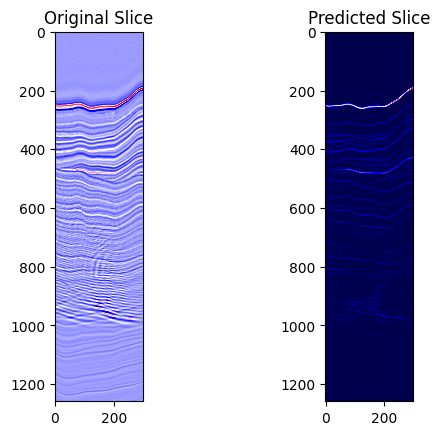

Epoch [78/200], Train Loss: 3992.1740, Train SSIM: 0.6321,           Val Loss: 5462.5691, Val SSIM: 0.5470


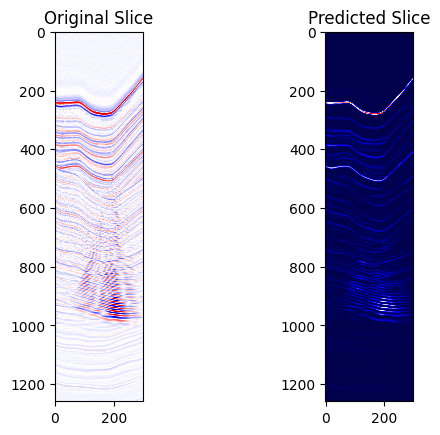

Epoch [79/200], Train Loss: 3998.7468, Train SSIM: 0.6328,           Val Loss: 5559.9633, Val SSIM: 0.5086


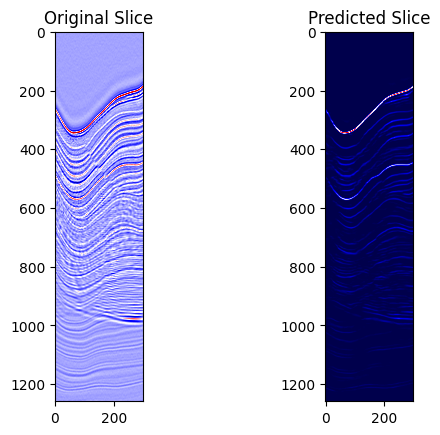

Epoch [80/200], Train Loss: 3991.0072, Train SSIM: 0.6343,           Val Loss: 5400.2812, Val SSIM: 0.5521


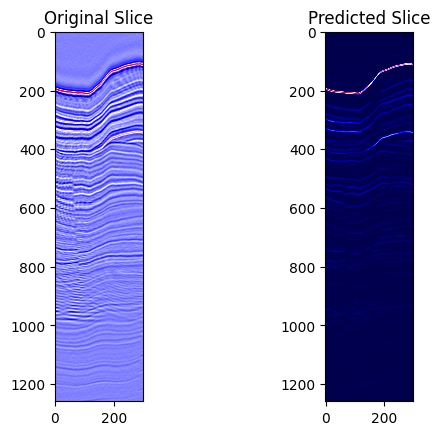

Epoch [81/200], Train Loss: 3980.3950, Train SSIM: 0.6337,           Val Loss: 5512.8967, Val SSIM: 0.5174


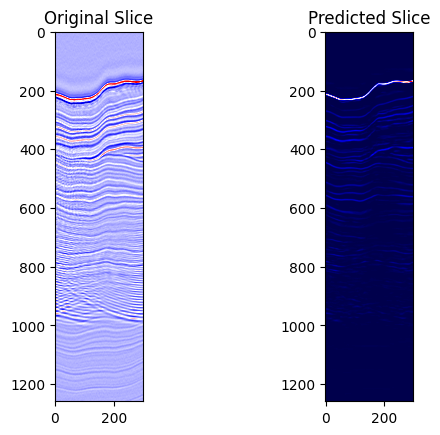

Epoch [82/200], Train Loss: 3983.0505, Train SSIM: 0.6327,           Val Loss: 5652.4378, Val SSIM: 0.4982


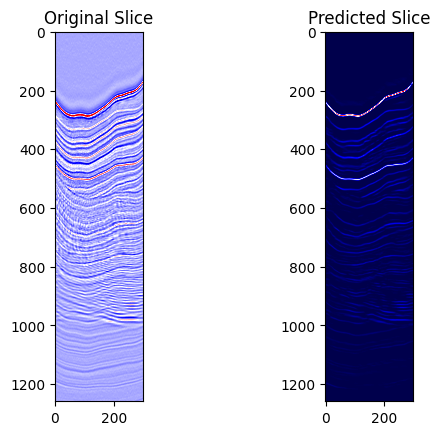

Epoch [83/200], Train Loss: 3994.0384, Train SSIM: 0.6333,           Val Loss: 5531.0606, Val SSIM: 0.5295


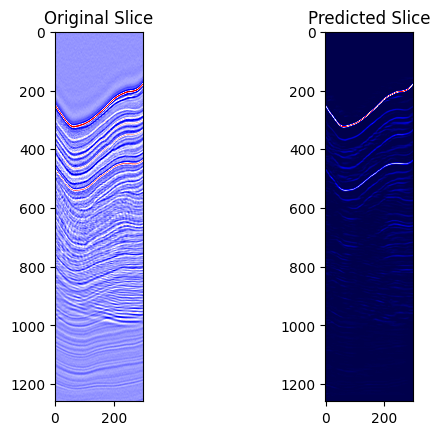

Epoch [84/200], Train Loss: 3999.0922, Train SSIM: 0.6327,           Val Loss: 5678.1222, Val SSIM: 0.4960


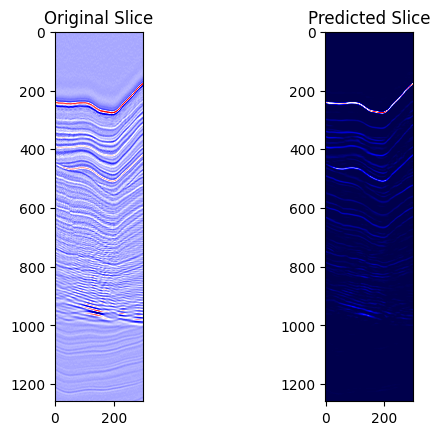

Epoch [85/200], Train Loss: 3988.7244, Train SSIM: 0.6323,           Val Loss: 5547.8156, Val SSIM: 0.5126


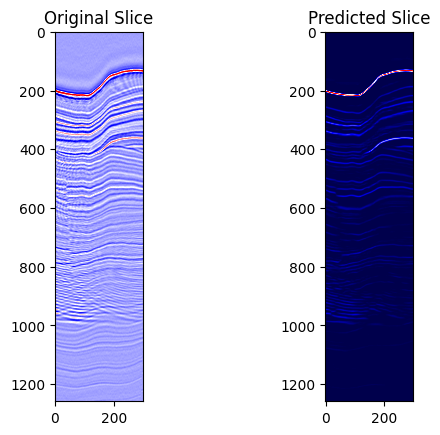

Epoch [86/200], Train Loss: 3988.9947, Train SSIM: 0.6335,           Val Loss: 5496.0840, Val SSIM: 0.5407


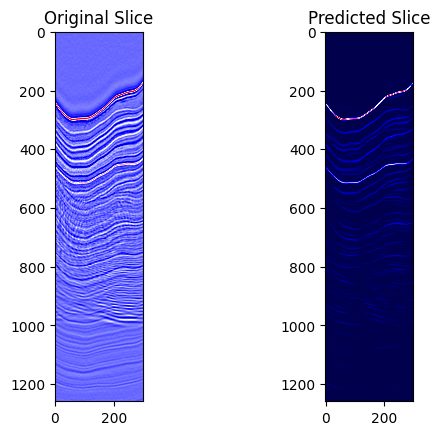

Epoch [87/200], Train Loss: 3984.6279, Train SSIM: 0.6330,           Val Loss: 5496.5597, Val SSIM: 0.5377


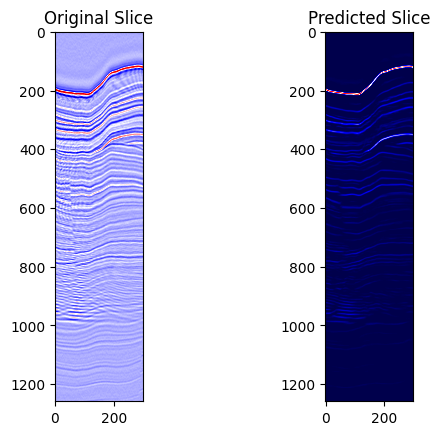

Epoch [88/200], Train Loss: 3987.0281, Train SSIM: 0.6340,           Val Loss: 5520.4827, Val SSIM: 0.5323


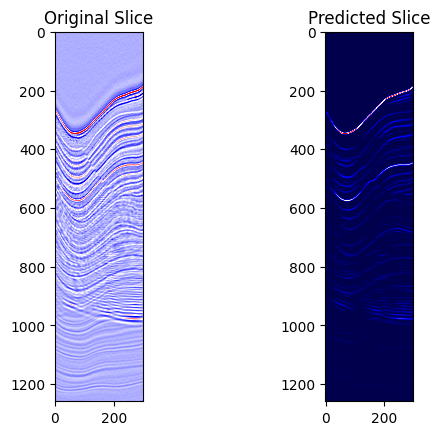

Epoch [89/200], Train Loss: 3989.7259, Train SSIM: 0.6339,           Val Loss: 5455.5055, Val SSIM: 0.5422


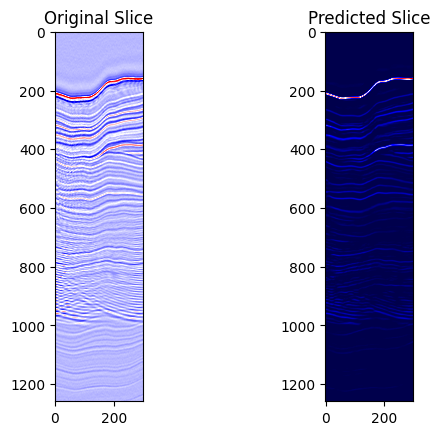

Epoch [90/200], Train Loss: 3986.3882, Train SSIM: 0.6337,           Val Loss: 5502.2102, Val SSIM: 0.5357


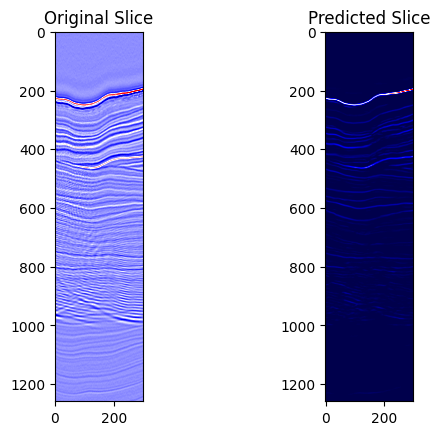

Epoch [91/200], Train Loss: 3980.8933, Train SSIM: 0.6342,           Val Loss: 5539.1582, Val SSIM: 0.5247


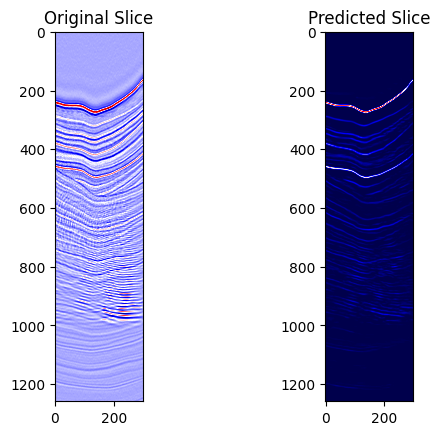

Epoch [92/200], Train Loss: 3980.8943, Train SSIM: 0.6346,           Val Loss: 5569.4353, Val SSIM: 0.5197


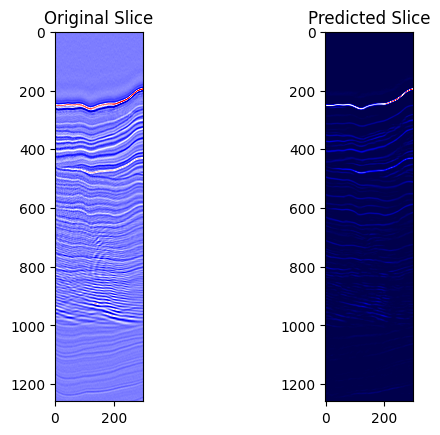

Epoch [93/200], Train Loss: 3973.7565, Train SSIM: 0.6346,           Val Loss: 5514.9306, Val SSIM: 0.5168


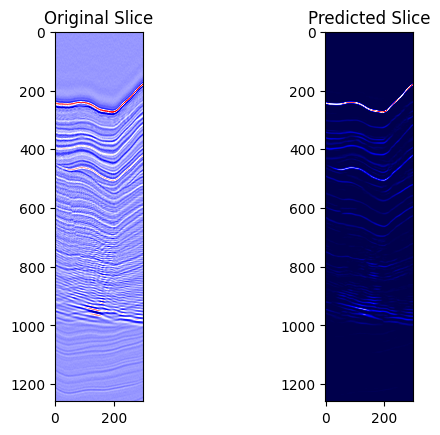

Epoch [94/200], Train Loss: 3990.5209, Train SSIM: 0.6345,           Val Loss: 5552.7907, Val SSIM: 0.5358


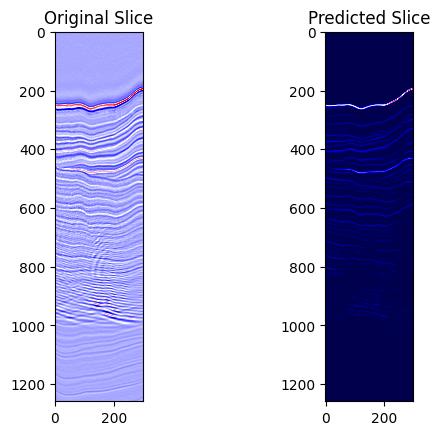

Epoch [95/200], Train Loss: 4001.4461, Train SSIM: 0.6330,           Val Loss: 5838.2355, Val SSIM: 0.4818


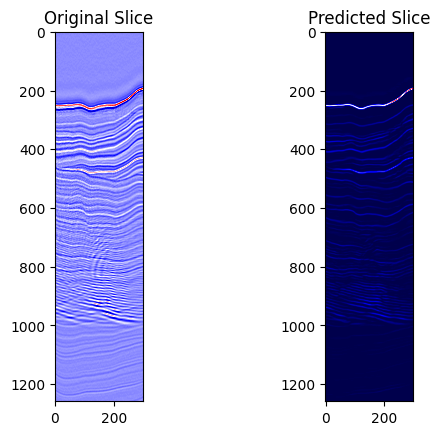

Epoch [96/200], Train Loss: 3977.0738, Train SSIM: 0.6338,           Val Loss: 5536.1969, Val SSIM: 0.5293


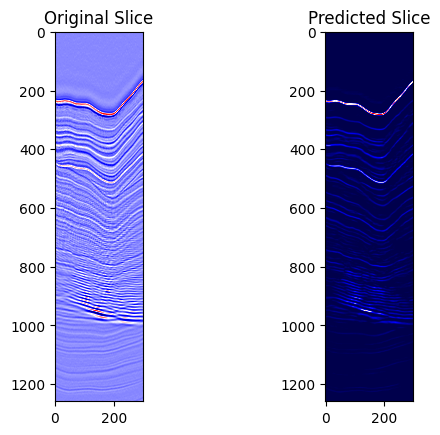

Epoch [97/200], Train Loss: 3978.1576, Train SSIM: 0.6345,           Val Loss: 5482.1851, Val SSIM: 0.5387


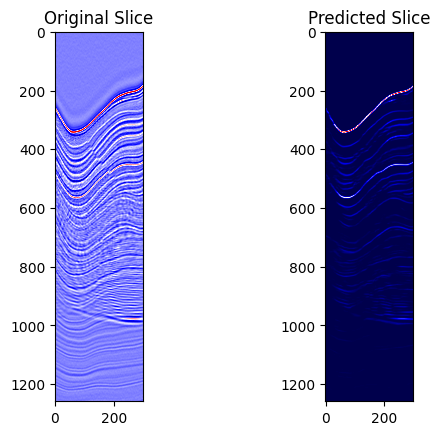

Epoch [98/200], Train Loss: 3980.2336, Train SSIM: 0.6347,           Val Loss: 5530.6007, Val SSIM: 0.5361


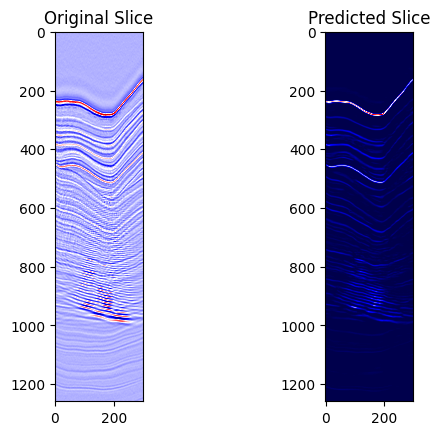

Epoch [99/200], Train Loss: 3980.8534, Train SSIM: 0.6328,           Val Loss: 5404.4292, Val SSIM: 0.5412


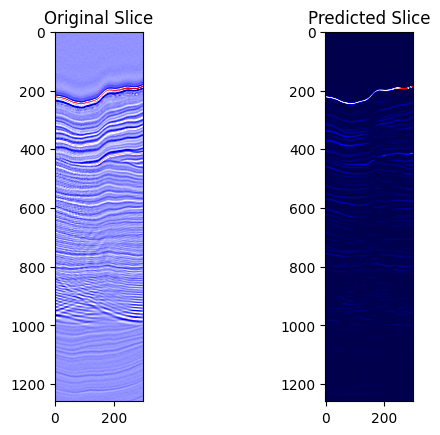

Epoch [100/200], Train Loss: 3990.0095, Train SSIM: 0.6347,           Val Loss: 5940.6257, Val SSIM: 0.4722


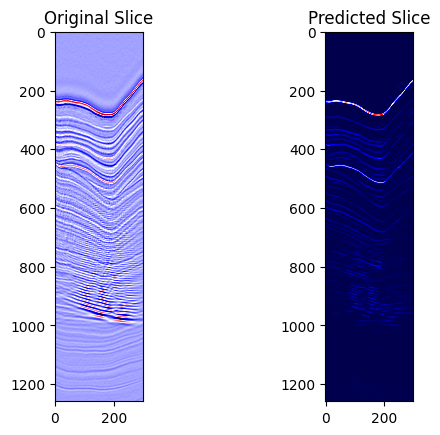

Epoch [101/200], Train Loss: 3978.5330, Train SSIM: 0.6348,           Val Loss: 6052.7986, Val SSIM: 0.4671


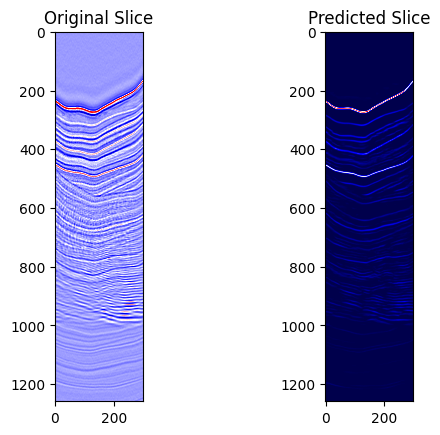

Epoch [102/200], Train Loss: 3989.6000, Train SSIM: 0.6349,           Val Loss: 5523.3521, Val SSIM: 0.5423


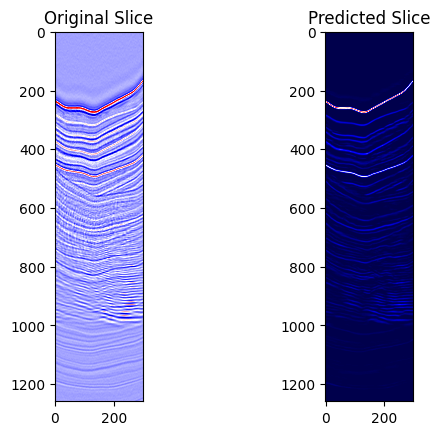

Epoch [103/200], Train Loss: 3976.8797, Train SSIM: 0.6341,           Val Loss: 5532.6736, Val SSIM: 0.5187


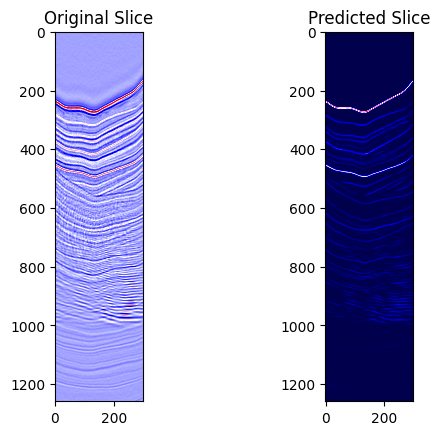

Epoch [104/200], Train Loss: 3975.3322, Train SSIM: 0.6343,           Val Loss: 5455.8816, Val SSIM: 0.5396


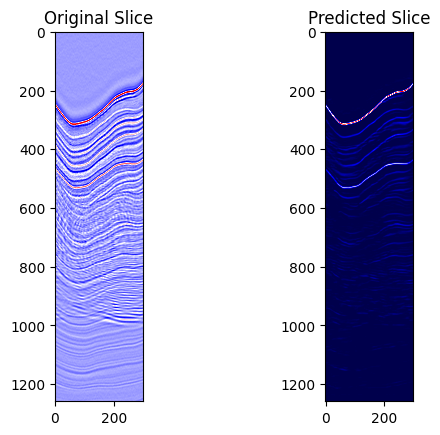

Epoch [105/200], Train Loss: 3970.8819, Train SSIM: 0.6359,           Val Loss: 5771.1830, Val SSIM: 0.4884


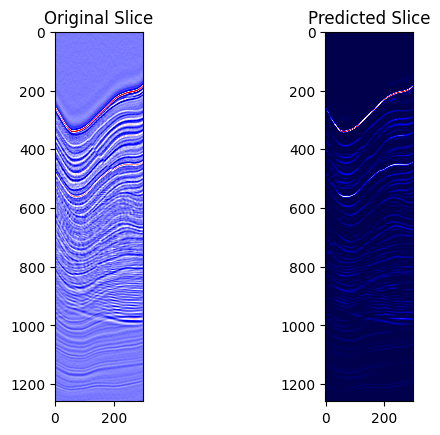

Epoch [106/200], Train Loss: 3968.3175, Train SSIM: 0.6351,           Val Loss: 5540.1193, Val SSIM: 0.4999


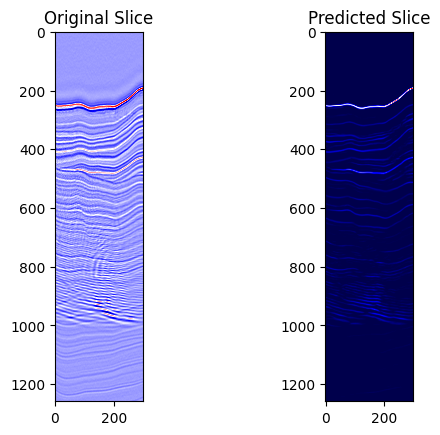

Epoch [107/200], Train Loss: 3972.6796, Train SSIM: 0.6349,           Val Loss: 5460.7096, Val SSIM: 0.5424


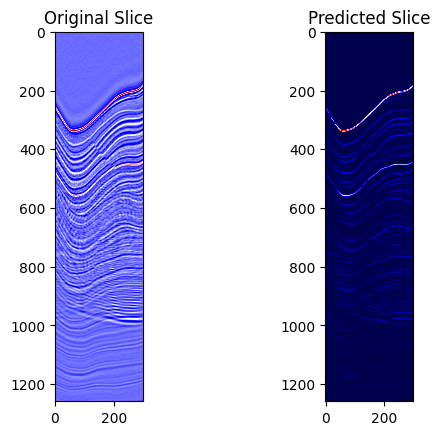

Epoch [108/200], Train Loss: 3977.6340, Train SSIM: 0.6346,           Val Loss: 5409.7947, Val SSIM: 0.5456


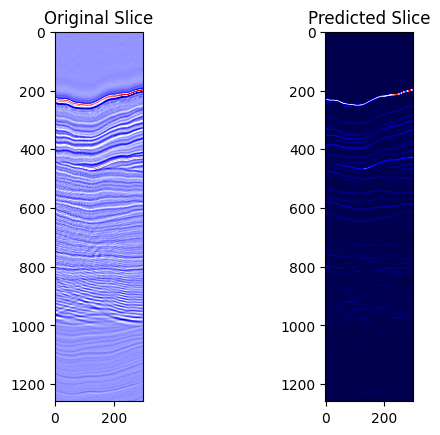

Epoch [109/200], Train Loss: 3977.5476, Train SSIM: 0.6353,           Val Loss: 5583.4867, Val SSIM: 0.5125


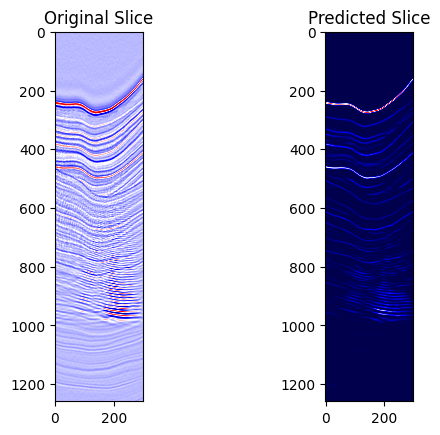

Epoch [110/200], Train Loss: 3973.3899, Train SSIM: 0.6354,           Val Loss: 5529.2513, Val SSIM: 0.5456


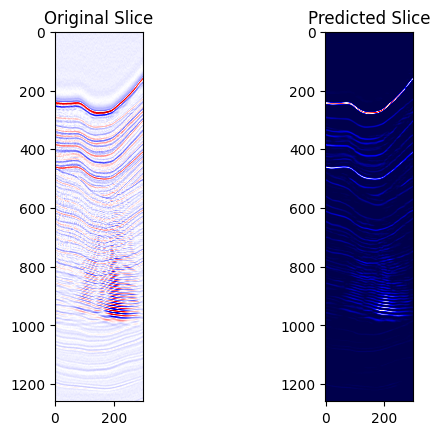

Epoch [111/200], Train Loss: 3978.4622, Train SSIM: 0.6350,           Val Loss: 5494.9646, Val SSIM: 0.5434


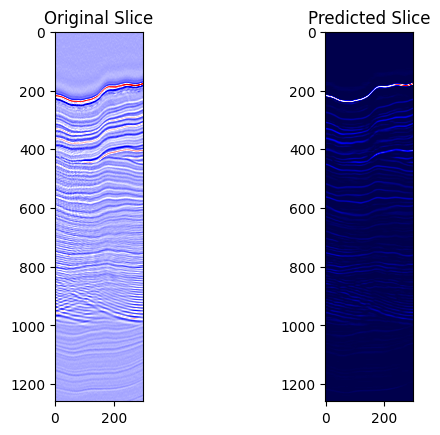

Epoch [112/200], Train Loss: 3966.5456, Train SSIM: 0.6359,           Val Loss: 5524.9414, Val SSIM: 0.5038


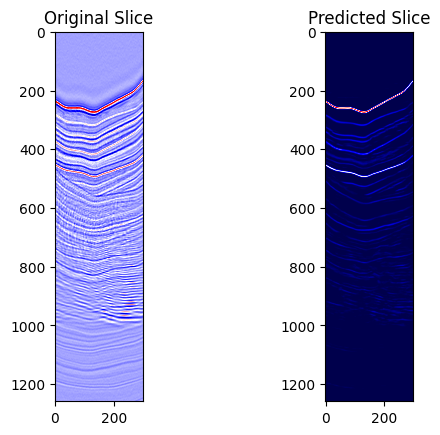

Epoch [113/200], Train Loss: 3971.3958, Train SSIM: 0.6355,           Val Loss: 5517.6636, Val SSIM: 0.5137


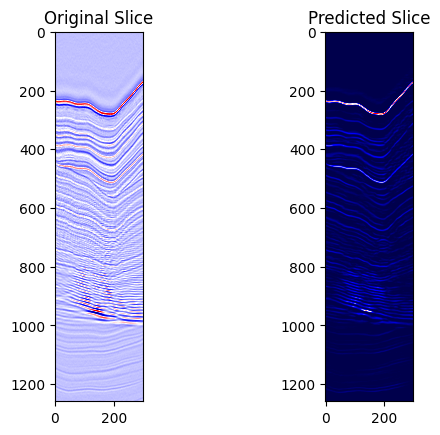

Epoch [114/200], Train Loss: 3984.7165, Train SSIM: 0.6351,           Val Loss: 5636.1445, Val SSIM: 0.4856


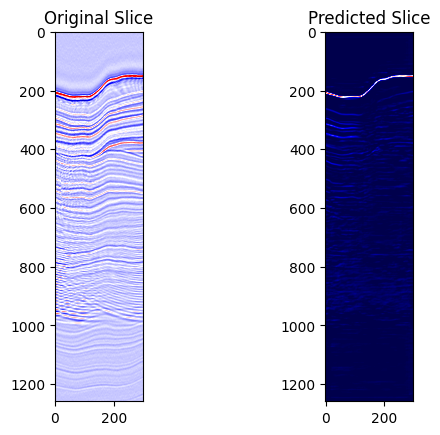

Epoch [115/200], Train Loss: 3976.6330, Train SSIM: 0.6347,           Val Loss: 6360.7460, Val SSIM: 0.4295


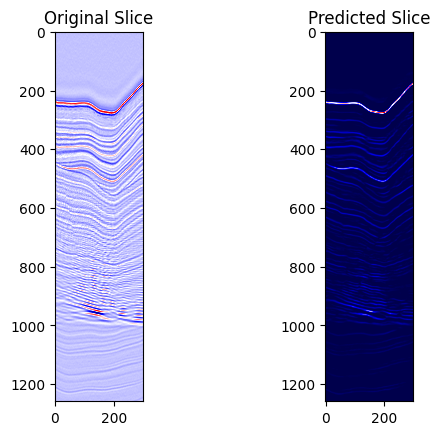

Epoch [116/200], Train Loss: 3981.9335, Train SSIM: 0.6354,           Val Loss: 5523.2650, Val SSIM: 0.5317


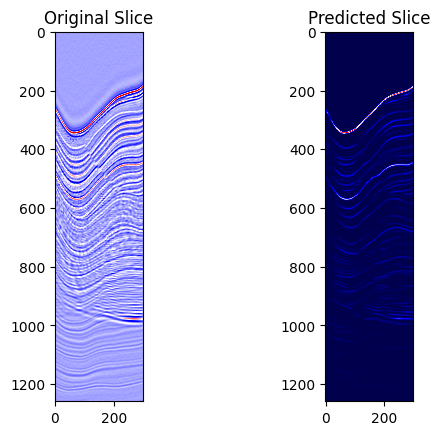

Epoch [117/200], Train Loss: 3971.0316, Train SSIM: 0.6352,           Val Loss: 5484.0386, Val SSIM: 0.5451


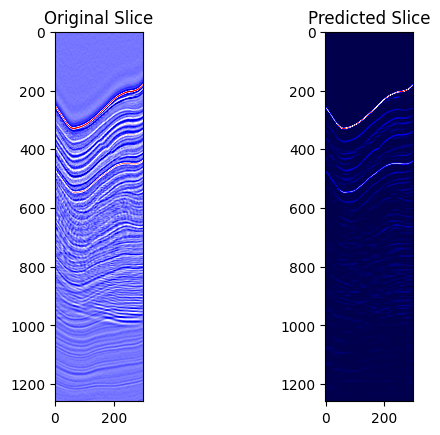

Epoch [118/200], Train Loss: 3974.8005, Train SSIM: 0.6355,           Val Loss: 5852.8721, Val SSIM: 0.4788


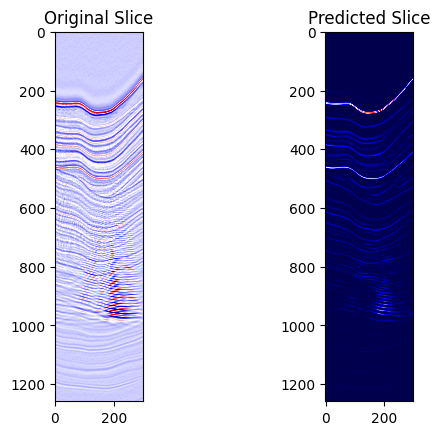

Epoch [119/200], Train Loss: 3971.2532, Train SSIM: 0.6354,           Val Loss: 5614.6915, Val SSIM: 0.5137


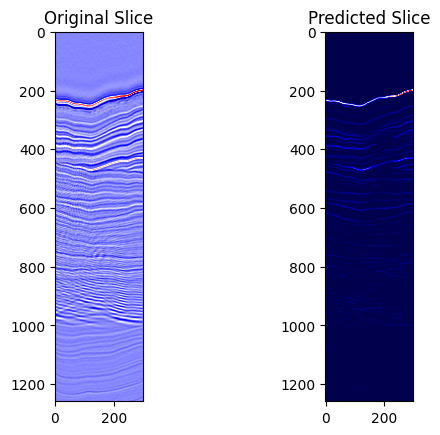

Epoch [120/200], Train Loss: 3966.0470, Train SSIM: 0.6356,           Val Loss: 5835.2411, Val SSIM: 0.4815


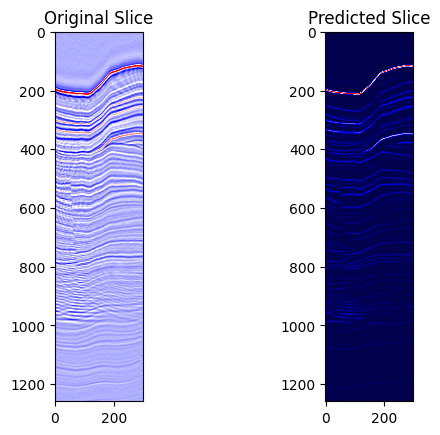

Epoch [121/200], Train Loss: 3974.6211, Train SSIM: 0.6355,           Val Loss: 5537.6907, Val SSIM: 0.5394


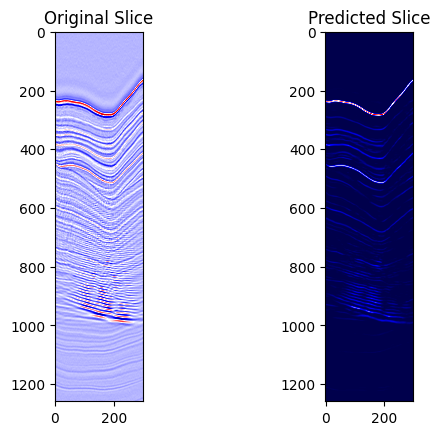

Epoch [122/200], Train Loss: 3967.7567, Train SSIM: 0.6353,           Val Loss: 5456.6317, Val SSIM: 0.5376


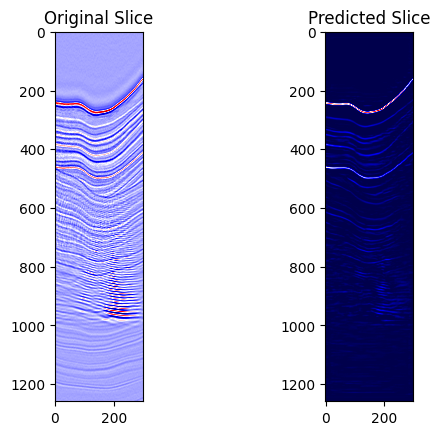

Epoch [123/200], Train Loss: 3976.5494, Train SSIM: 0.6361,           Val Loss: 6094.6974, Val SSIM: 0.4509


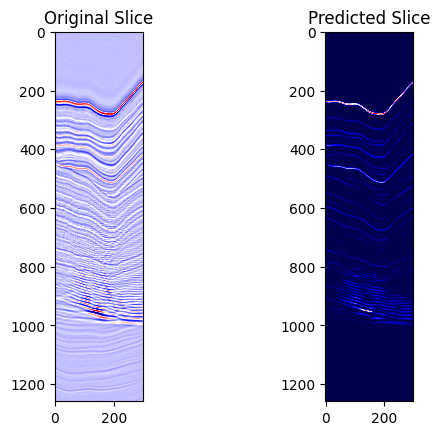

Epoch [124/200], Train Loss: 3961.2997, Train SSIM: 0.6352,           Val Loss: 5489.3680, Val SSIM: 0.5370


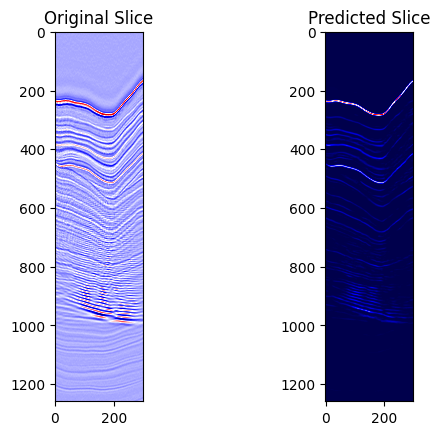

Epoch [125/200], Train Loss: 3967.1061, Train SSIM: 0.6365,           Val Loss: 5448.5544, Val SSIM: 0.5281


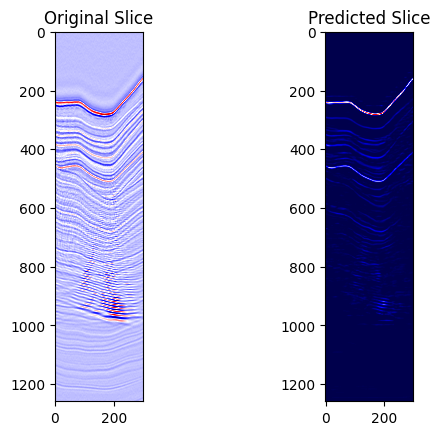

Epoch [126/200], Train Loss: 3968.7770, Train SSIM: 0.6365,           Val Loss: 6450.7890, Val SSIM: 0.4487


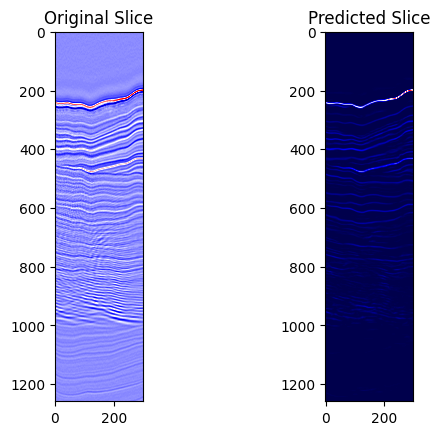

Epoch [127/200], Train Loss: 3979.0675, Train SSIM: 0.6356,           Val Loss: 5605.4380, Val SSIM: 0.5119


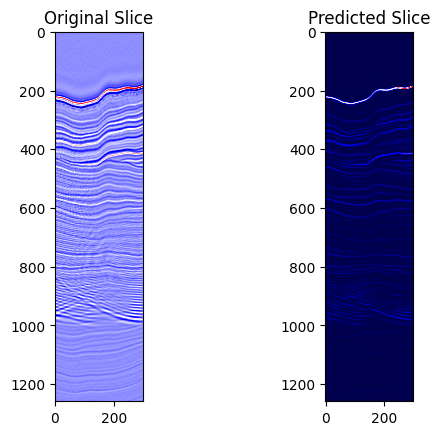

Epoch [128/200], Train Loss: 3967.8592, Train SSIM: 0.6359,           Val Loss: 5413.4832, Val SSIM: 0.5465


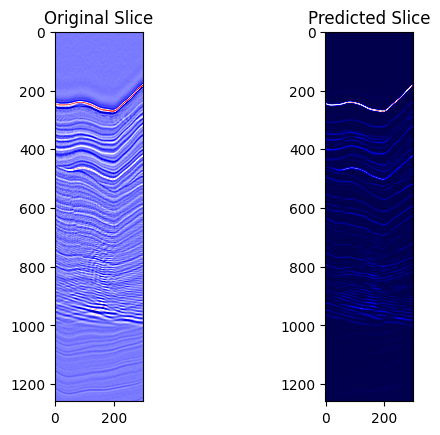

Epoch [129/200], Train Loss: 3963.1079, Train SSIM: 0.6373,           Val Loss: 5465.0744, Val SSIM: 0.5168


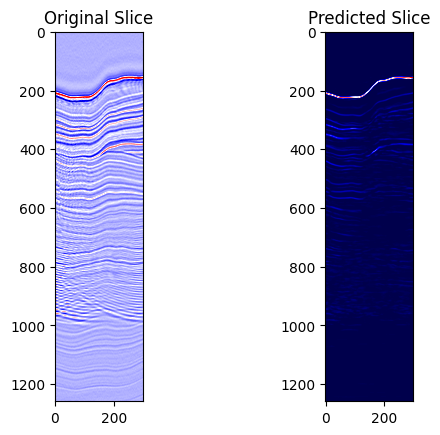

Epoch [130/200], Train Loss: 3967.8439, Train SSIM: 0.6366,           Val Loss: 5944.6471, Val SSIM: 0.4718


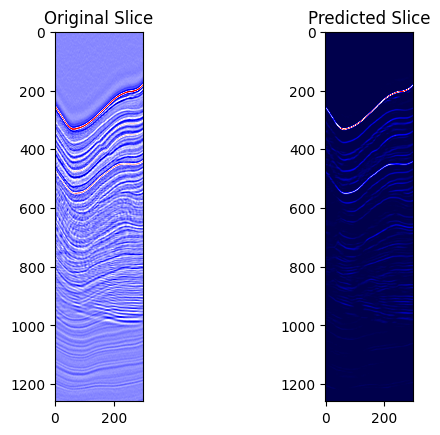

Epoch [131/200], Train Loss: 3978.0850, Train SSIM: 0.6346,           Val Loss: 5413.0751, Val SSIM: 0.5435


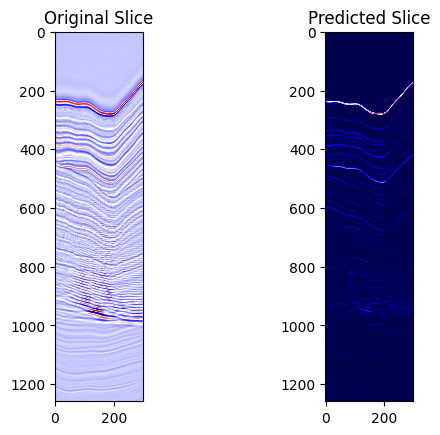

Epoch [132/200], Train Loss: 3965.6603, Train SSIM: 0.6364,           Val Loss: 6230.7822, Val SSIM: 0.4495


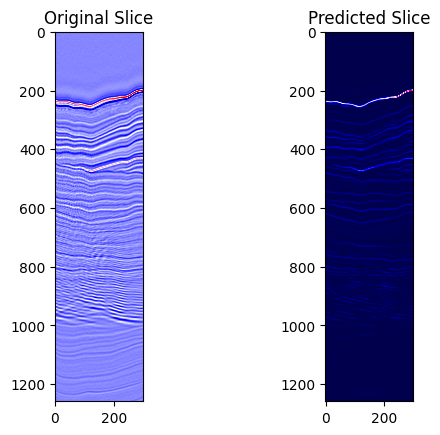

Epoch [133/200], Train Loss: 3961.6408, Train SSIM: 0.6356,           Val Loss: 5433.7606, Val SSIM: 0.5426


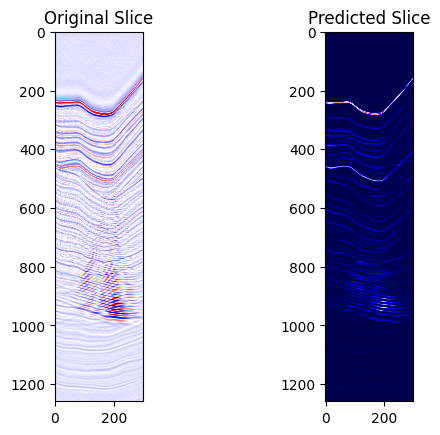

Epoch [134/200], Train Loss: 3958.7554, Train SSIM: 0.6364,           Val Loss: 5421.6120, Val SSIM: 0.5439


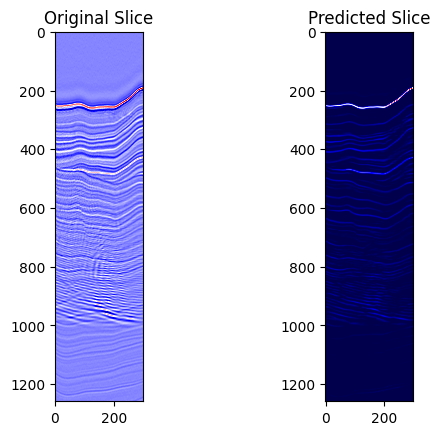

Epoch [135/200], Train Loss: 3966.3649, Train SSIM: 0.6369,           Val Loss: 5420.2144, Val SSIM: 0.5420


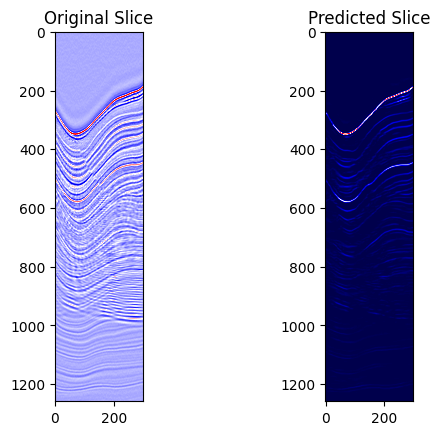

Epoch [136/200], Train Loss: 3967.9599, Train SSIM: 0.6363,           Val Loss: 5537.5609, Val SSIM: 0.5288


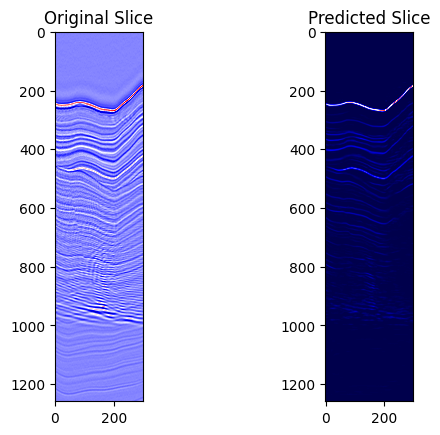

Epoch [137/200], Train Loss: 3972.7477, Train SSIM: 0.6361,           Val Loss: 6028.6181, Val SSIM: 0.4695


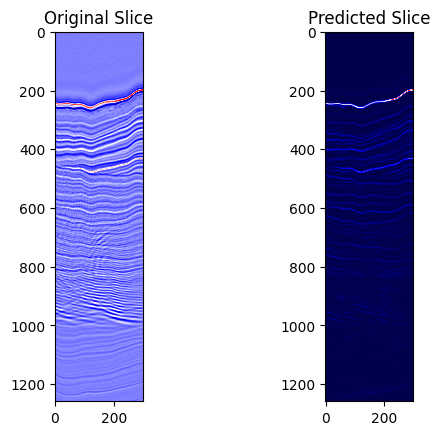

Epoch [138/200], Train Loss: 3976.9202, Train SSIM: 0.6359,           Val Loss: 5576.3738, Val SSIM: 0.5078


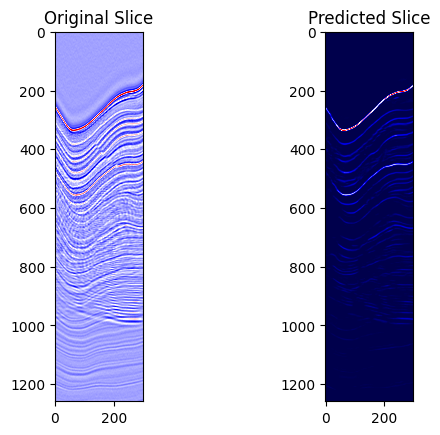

Epoch [139/200], Train Loss: 3965.6376, Train SSIM: 0.6356,           Val Loss: 5512.0811, Val SSIM: 0.5465


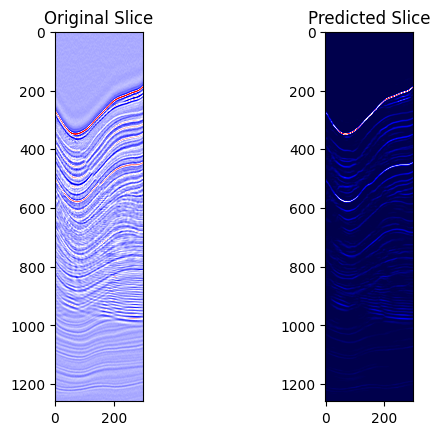

Epoch [140/200], Train Loss: 3974.8388, Train SSIM: 0.6353,           Val Loss: 5501.2724, Val SSIM: 0.5369


In [ ]:
# Number of epochs
num_epochs = 200

# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    running_ssim = 0.0

    for x_batch, y_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(x_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        batch_ssim = ssim_metric(outputs.detach(), y_batch.detach())
        running_ssim += batch_ssim.item()

    # Validation phase
    model.eval()
    val_loss = 0.0
    val_ssim = 0.0
    with torch.no_grad():
        for x_val, y_val in val_loader:
            val_outputs = model(x_val)
            val_loss += criterion(val_outputs, y_val).item()
            val_ssim += ssim_metric(val_outputs, y_val).item()

    # Prediction on a single slice from X_slices_t
    random_slice = X_slices_t[torch.randint(0, len(X_slices_t), (1,)).item()]

    # Convert to PyTorch tensor and add batch and channel dimensions
    random_slice = torch.tensor(random_slice, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

    prediction = model(random_slice).detach()

    # Visualize the original and predicted slice
    plt.subplot(1, 2, 1)
    plt.title("Original Slice")
    plt.imshow(random_slice.squeeze().cpu().numpy(), cmap='seismic')

    plt.subplot(1, 2, 2)
    plt.title("Predicted Slice")
    plt.imshow(prediction.squeeze().cpu().numpy(), cmap='seismic')
    plt.show()

    print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {running_loss / len(train_loader):.4f}, Train SSIM: {running_ssim / len(train_loader):.4f}, \
          Val Loss: {val_loss / len(val_loader):.4f}, Val SSIM: {val_ssim / len(val_loader):.4f}")


print("Training complete!")
